# World Energy Consumption

# Youssef Azam mahfouze

## Import Libraries

In [1]:
#warnings
import warnings
warnings.filterwarnings('ignore')
#cleaning,processing
import pandas as pd
pd.plotting.register_matplotlib_converters()
import numpy as np
import scipy
import math
import collections
# visualization
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
#modal
from sklearn.model_selection import train_test_split
from sklearn.metrics import  accuracy_score
from xgboost import XGBRegressor 
from sklearn.metrics import mean_absolute_error

In [2]:
df=pd.read_csv(r'C:\Users\youssef azam\Desktop\World Energy Consumption.csv')
df.head()

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
0,AFG,Afghanistan,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,1901,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,Afghanistan,1902,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,Afghanistan,1903,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,Afghanistan,1904,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df.tail()

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
17427,ZWE,Zimbabwe,2015,-25.013,-10.847,NaN,NaN,NaN,NaN,-0.789,...,0.579,NaN,2.503057e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
17428,ZWE,Zimbabwe,2016,-37.694,-12.257,NaN,NaN,NaN,NaN,-14.633,...,0.641,NaN,2.515176e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
17429,ZWE,Zimbabwe,2017,8.375,1.697,NaN,NaN,NaN,NaN,NaN,...,0.773,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN
17430,ZWE,Zimbabwe,2018,22.555,4.952,NaN,NaN,NaN,NaN,NaN,...,0.970,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN
17431,ZWE,Zimbabwe,2019,-35.015,-9.422,NaN,NaN,NaN,NaN,NaN,...,0.956,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN


In [4]:
df.set_index(df.year)

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
year,,,,,,,,,,,,,,,,,,,,,
1900,AFG,Afghanistan,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1901,AFG,Afghanistan,1901,NaN,0.000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1902,AFG,Afghanistan,1902,NaN,0.000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1903,AFG,Afghanistan,1903,NaN,0.000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1904,AFG,Afghanistan,1904,NaN,0.000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015,ZWE,Zimbabwe,2015,-25.013,-10.847,NaN,NaN,NaN,NaN,-0.789,...,0.579,NaN,2.503057e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
2016,ZWE,Zimbabwe,2016,-37.694,-12.257,NaN,NaN,NaN,NaN,-14.633,...,0.641,NaN,2.515176e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
2017,ZWE,Zimbabwe,2017,8.375,1.697,NaN,NaN,NaN,NaN,NaN,...,0.773,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN


In [5]:
df.assign(year=pd.to_datetime(df.year, format='%Y')).set_index('year')

,iso_code,country,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
year,,,,,,,,,,,,,,,,,,,,,
1900-01-01,AFG,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1901-01-01,AFG,Afghanistan,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1902-01-01,AFG,Afghanistan,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1903-01-01,AFG,Afghanistan,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1904-01-01,AFG,Afghanistan,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-01-01,ZWE,Zimbabwe,-25.013,-10.847,NaN,NaN,NaN,NaN,-0.789,-0.443,...,0.579,NaN,2.503057e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
2016-01-01,ZWE,Zimbabwe,-37.694,-12.257,NaN,NaN,NaN,NaN,-14.633,-8.142,...,0.641,NaN,2.515176e+10,0.0,NaN,NaN,NaN,NaN,0.0,NaN
2017-01-01,ZWE,Zimbabwe,8.375,1.697,NaN,NaN,NaN,NaN,NaN,NaN,...,0.773,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN


## EDA  (Exploratory Data Analysis)

In [6]:
df.shape

(17432, 122)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17432 entries, 0 to 17431
Columns: 122 entries, iso_code to wind_energy_per_capita
dtypes: float64(119), int64(1), object(2)
memory usage: 16.2+ MB


In [8]:
# min and max year
min_year=df.year.min()
max_year=df.year.max()
print("min year is = ",min_year,"\n max year is = ",max_year)

min year is =  1900 
 max year is =  2020


In [9]:
# How many Unique Year do we Have in Dataset 
print(df.year.unique(),"\n")
print("Total Number of Unique Year", df.year.nunique(), "\n")

[1900 1901 1902 1903 1904 1905 1906 1907 1908 1909 1910 1911 1912 1913
 1914 1915 1916 1917 1918 1919 1920 1921 1922 1923 1924 1925 1926 1927
 1928 1929 1930 1931 1932 1933 1934 1935 1936 1937 1938 1939 1940 1941
 1942 1943 1944 1945 1946 1947 1948 1949 1950 1951 1952 1953 1954 1955
 1956 1957 1958 1959 1960 1961 1962 1963 1964 1965 1966 1967 1968 1969
 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983
 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997
 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020] 

Total Number of Unique Year 121 



In [10]:
df.columns.tolist()

['iso_code',
 'country',
 'year',
 'coal_prod_change_pct',
 'coal_prod_change_twh',
 'gas_prod_change_pct',
 'gas_prod_change_twh',
 'oil_prod_change_pct',
 'oil_prod_change_twh',
 'energy_cons_change_pct',
 'energy_cons_change_twh',
 'biofuel_share_elec',
 'biofuel_elec_per_capita',
 'biofuel_cons_change_pct',
 'biofuel_share_energy',
 'biofuel_cons_change_twh',
 'biofuel_consumption',
 'biofuel_cons_per_capita',
 'carbon_intensity_elec',
 'coal_share_elec',
 'coal_cons_change_pct',
 'coal_share_energy',
 'coal_cons_change_twh',
 'coal_consumption',
 'coal_elec_per_capita',
 'coal_cons_per_capita',
 'coal_production',
 'coal_prod_per_capita',
 'electricity_generation',
 'biofuel_electricity',
 'coal_electricity',
 'fossil_electricity',
 'gas_electricity',
 'hydro_electricity',
 'nuclear_electricity',
 'oil_electricity',
 'other_renewable_electricity',
 'other_renewable_exc_biofuel_electricity',
 'renewables_electricity',
 'solar_electricity',
 'wind_electricity',
 'energy_per_gdp',
 '

In [11]:
d=df['country'].value_counts()
d

Norway         121
India          121
Denmark        121
Portugal       121
Bulgaria       121
              ... 
Palestine       23
South Sudan     21
Kosovo          20
Montenegro      20
Timor           14
Name: country, Length: 242, dtype: int64

In [12]:
d.max()

121

## Data cleaning

In [13]:
df.isnull().sum()

iso_code                   1802
country                       0
year                          0
coal_prod_change_pct       9987
coal_prod_change_twh       7038
                          ...  
wind_share_energy         13148
wind_cons_change_twh      13225
wind_consumption          13142
wind_elec_per_capita      11933
wind_energy_per_capita    13142
Length: 122, dtype: int64

In [14]:
missing=df.isnull().sum()
n=missing.sum()/np.product(df.shape)
n
# outliers
#seems a lot of data is missing and by picking different timeframes,
#you may see that there is more data for recent years.
#If we remove all rows with missing data, only little portion of it will remain

0.6808610883319917

In [15]:
# Creating a dataframe with the detailed calculations of % of missing values.
missingna=df.isna().sum() / len(df) * 100 
missingna[missingna > 0].sort_values(ascending = False)
missingnadf=pd.DataFrame(missingna) #creat data frame
pd.set_option('display.max_rows', 122)
missingnadf.head(10)

,0
iso_code,10.337311
country,0.000000
year,0.000000
coal_prod_change_pct,57.291189
coal_prod_change_twh,40.374025
gas_prod_change_pct,72.108765
gas_prod_change_twh,54.721202
oil_prod_change_pct,62.591785
oil_prod_change_twh,50.866223
energy_cons_change_pct,43.540615


In [16]:
# Focus on the recent data: as data for the earliest years is missing I will further focus on the most recent decades where more raw data is availabe
# There are a lot of null values and replacement of some of them will lead to the fact that a lot of data will be missing, so let's replace Nulls with forward/backward filling.
df.replace([np.inf, -np.inf], np.nan,inplace=True)
df=df.fillna(method='ffill').fillna(method='bfill')

In [17]:
df.isnull().sum()
# count null of dataset in each columns

iso_code                                   0
country                                    0
year                                       0
coal_prod_change_pct                       0
coal_prod_change_twh                       0
gas_prod_change_pct                        0
gas_prod_change_twh                        0
oil_prod_change_pct                        0
oil_prod_change_twh                        0
energy_cons_change_pct                     0
energy_cons_change_twh                     0
biofuel_share_elec                         0
biofuel_elec_per_capita                    0
biofuel_cons_change_pct                    0
biofuel_share_energy                       0
biofuel_cons_change_twh                    0
biofuel_consumption                        0
biofuel_cons_per_capita                    0
carbon_intensity_elec                      0
coal_share_elec                            0
coal_cons_change_pct                       0
coal_share_energy                          0
coal_cons_

In [18]:
# Formatted floats to avoid scientific notations
pd.options.display.float_format = '{:,.2f}'.format

In [20]:
df.describe()

,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,biofuel_share_elec,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
count,"17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00",...,"17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00","17,432.00"
mean,"1,973.09",1.41,7.71,"53,596,431,849,477.59",22.41,11.27,18.48,3.70,38.94,1.82,...,56.82,231.44,"592,751,650,164.06",2.64,47.34,1.79,14.56,128.96,157.39,651.74
std,34.33,456.89,113.32,"7,076,352,952,043,702.00",119.52,218.23,168.17,19.62,273.06,4.07,...,131.62,337.33,"3,767,631,093,166.43",5.91,"2,035.47",3.11,60.33,555.56,394.49,"1,155.95"
min,"1,900.00",-100.00,"-2,326.87",-100.00,"-1,054.32",-100.00,"-2,239.74",-92.63,"-6,083.41",0.00,...,0.00,0.00,"196,308,000.00",0.00,-100.00,0.00,-10.41,0.00,0.00,0.00
25%,"1,946.00",-4.07,0.00,-2.16,0.00,-2.74,-0.05,-1.01,-0.15,0.00,...,0.00,1.87,"17,433,516,032.00",0.00,6.17,0.00,0.00,0.00,0.00,0.00
50%,"1,983.00",0.00,0.00,0.00,0.00,0.00,0.00,2.27,0.46,0.09,...,1.52,51.81,"62,722,076,672.00",0.01,14.18,0.42,0.18,1.68,0.14,81.76
75%,"2,002.00",3.38,0.21,3.61,2.45,3.18,2.74,6.16,7.97,1.37,...,29.97,413.25,"253,000,000,000.00",2.01,28.20,2.53,3.07,18.02,64.36,863.17
max,"2,020.00","44,965.75","3,060.59","934,293,000,000,000,000.00","2,112.97","25,500.00","2,790.61","1,487.99","6,446.81",33.91,...,825.09,"1,763.67","107,000,000,000,000.00",56.34,"242,384.84",20.66,428.74,"3,540.05","2,825.43","6,928.36"


In [21]:
df.isnull().sum()
nandf=df[df.isna().any(axis=1)]
nandf

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita


In [22]:
l=[]        
x=[l.append(i) for i in df['country'] if i not in l]

In [23]:
x=-1
for column in df.columns:
    x+=1
    print(x, column)

0 iso_code
1 country
2 year
3 coal_prod_change_pct
4 coal_prod_change_twh
5 gas_prod_change_pct
6 gas_prod_change_twh
7 oil_prod_change_pct
8 oil_prod_change_twh
9 energy_cons_change_pct
10 energy_cons_change_twh
11 biofuel_share_elec
12 biofuel_elec_per_capita
13 biofuel_cons_change_pct
14 biofuel_share_energy
15 biofuel_cons_change_twh
16 biofuel_consumption
17 biofuel_cons_per_capita
18 carbon_intensity_elec
19 coal_share_elec
20 coal_cons_change_pct
21 coal_share_energy
22 coal_cons_change_twh
23 coal_consumption
24 coal_elec_per_capita
25 coal_cons_per_capita
26 coal_production
27 coal_prod_per_capita
28 electricity_generation
29 biofuel_electricity
30 coal_electricity
31 fossil_electricity
32 gas_electricity
33 hydro_electricity
34 nuclear_electricity
35 oil_electricity
36 other_renewable_electricity
37 other_renewable_exc_biofuel_electricity
38 renewables_electricity
39 solar_electricity
40 wind_electricity
41 energy_per_gdp
42 energy_per_capita
43 fossil_cons_change_pct
44 foss

In [24]:
df=df.copy()
filt=df['year']>1970
w=df[filt].groupby('country').get_group('World')
w.nsmallest(10, ['energy_cons_change_pct', 'fossil_cons_change_pct'])
w.nlargest(10, ['low_carbon_energy_per_capita','renewables_energy_per_capita'])

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
17023,OWID_WRL,World,2019,1.52,698.28,3.42,"1,318.30",-0.33,-174.65,1.33,...,91.27,232.45,"107,000,000,000,000.00",5.47,12.14,2.18,383.21,"3,540.05",183.70,458.94
17024,OWID_WRL,World,2020,1.52,698.28,3.42,"1,318.30",-0.33,-174.65,1.33,...,108.33,232.45,"107,000,000,000,000.00",6.15,12.14,2.18,383.21,"3,540.05",204.01,458.94
17022,OWID_WRL,World,2018,5.03,"2,195.18",5.04,"1,849.83",2.41,"1,231.38",2.82,...,75.08,189.80,"107,000,000,000,000.00",4.95,10.67,1.97,304.42,"3,156.84",165.91,413.68
17021,OWID_WRL,World,2017,2.52,"1,071.37",3.73,"1,321.64",0.33,169.82,1.78,...,58.73,148.04,"107,000,000,000,000.00",4.62,17.69,1.83,428.74,"2,852.43",150.38,377.91
17020,OWID_WRL,World,2016,-5.18,"-2,326.87",1.14,397.18,0.37,185.18,1.37,...,44.15,110.59,"107,000,000,000,000.00",4.01,15.21,1.58,320.02,"2,423.69",128.47,324.72
17019,OWID_WRL,World,2015,-2.63,"-1,215.34",2.18,747.30,3.12,"1,534.11",0.73,...,34.51,88.04,"105,000,000,000,000.00",3.55,17.01,1.39,305.77,"2,103.67",112.29,285.06
17018,OWID_WRL,World,2014,-0.35,-163.00,2.03,680.63,2.32,"1,113.37",0.81,...,27.00,69.02,"102,000,000,000,000.00",3.14,10.45,1.20,170.17,"1,797.90",98.78,246.45
17017,OWID_WRL,World,2013,1.80,816.93,1.17,389.40,0.21,100.22,1.89,...,18.35,49.40,"99,300,000,000,000.00",2.85,19.04,1.09,260.39,"1,627.74",89.21,225.74
17014,OWID_WRL,World,2010,5.55,"2,203.03",7.20,"2,112.97",2.01,912.84,4.81,...,4.39,12.64,"88,500,000,000,000.00",1.67,24.75,0.64,179.25,903.47,49.80,129.87
17016,OWID_WRL,World,2012,1.15,515.76,2.06,669.60,2.79,"1,299.15",1.29,...,13.43,36.44,"96,600,000,000,000.00",2.42,19.75,0.94,225.50,"1,367.35",74.59,191.89


## Data processing

In [25]:
co=df['population'].mean()
co1=df[df['population']>co]
co1
#popualtion 

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
120,AFG,Africa,1900,24.40,1.93,0.00,0.00,833.33,0.00,8.57,...,1.05,0.00,"64,297,426,944.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00
121,AFG,Africa,1901,67.81,4.53,0.00,0.00,833.33,0.00,8.57,...,1.05,0.00,"64,297,426,944.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00
122,AFG,Africa,1902,49.07,5.50,0.00,0.00,833.33,0.00,8.57,...,1.05,0.00,"64,297,426,944.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00
123,AFG,Africa,1903,35.70,5.96,0.00,0.00,833.33,0.00,8.57,...,1.05,0.00,"64,297,426,944.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00
124,AFG,Africa,1904,12.88,2.92,0.00,0.00,833.33,0.00,8.57,...,1.05,0.00,"64,297,426,944.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17020,OWID_WRL,World,2016,-5.18,"-2,326.87",1.14,397.18,0.37,185.18,1.37,...,44.15,110.59,"107,000,000,000,000.00",4.01,15.21,1.58,320.02,"2,423.69",128.47,324.72
17021,OWID_WRL,World,2017,2.52,"1,071.37",3.73,"1,321.64",0.33,169.82,1.78,...,58.73,148.04,"107,000,000,000,000.00",4.62,17.69,1.83,428.74,"2,852.43",150.38,377.91
17022,OWID_WRL,World,2018,5.03,"2,195.18",5.04,"1,849.83",2.41,"1,231.38",2.82,...,75.08,189.80,"107,000,000,000,000.00",4.95,10.67,1.97,304.42,"3,156.84",165.91,413.68
17023,OWID_WRL,World,2019,1.52,698.28,3.42,"1,318.30",-0.33,-174.65,1.33,...,91.27,232.45,"107,000,000,000,000.00",5.47,12.14,2.18,383.21,"3,540.05",183.70,458.94


In [26]:
a=df['gdp'].mean()
co2=df[df['gdp']>a]
co2

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
786,ARG,Argentina,2006,0.00,0.86,1.03,4.57,0.16,0.74,5.07,...,0.00,0.01,"631,000,000,000.00",0.06,-3.51,0.02,-0.01,0.19,1.78,4.74
787,ARG,Argentina,2007,0.00,0.86,-2.75,-12.35,-3.09,-14.15,4.41,...,0.00,0.01,"694,000,000,000.00",0.06,-12.11,0.02,-0.02,0.16,1.54,4.12
788,ARG,Argentina,2008,0.00,0.86,-1.72,-7.49,-1.07,-4.76,1.70,...,0.00,0.01,"741,000,000,000.00",0.04,-32.31,0.01,-0.05,0.11,1.05,2.76
789,ARG,Argentina,2009,0.00,0.86,-5.95,-25.47,-9.95,-43.67,-1.93,...,0.00,0.01,"692,000,000,000.00",0.03,-12.75,0.01,-0.01,0.10,0.89,2.39
790,ARG,Argentina,2010,0.00,0.86,-3.24,-13.04,-2.25,-8.88,5.23,...,0.00,0.01,"772,000,000,000.00",0.02,-31.59,0.01,-0.03,0.07,0.61,1.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17020,OWID_WRL,World,2016,-5.18,"-2,326.87",1.14,397.18,0.37,185.18,1.37,...,44.15,110.59,"107,000,000,000,000.00",4.01,15.21,1.58,320.02,"2,423.69",128.47,324.72
17021,OWID_WRL,World,2017,2.52,"1,071.37",3.73,"1,321.64",0.33,169.82,1.78,...,58.73,148.04,"107,000,000,000,000.00",4.62,17.69,1.83,428.74,"2,852.43",150.38,377.91
17022,OWID_WRL,World,2018,5.03,"2,195.18",5.04,"1,849.83",2.41,"1,231.38",2.82,...,75.08,189.80,"107,000,000,000,000.00",4.95,10.67,1.97,304.42,"3,156.84",165.91,413.68
17023,OWID_WRL,World,2019,1.52,698.28,3.42,"1,318.30",-0.33,-174.65,1.33,...,91.27,232.45,"107,000,000,000,000.00",5.47,12.14,2.18,383.21,"3,540.05",183.70,458.94


In [27]:
co2.describe()

,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,biofuel_share_elec,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
count,"2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00",...,"2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00","2,129.00"
mean,"1,982.95",0.20,30.73,5.17,70.12,5.05,71.90,2.42,104.74,2.04,...,83.76,203.09,"4,088,177,078,440.58",3.35,202.40,1.68,11.14,89.63,202.56,615.92
std,32.94,30.33,242.77,122.66,221.72,97.67,316.61,12.16,497.15,3.72,...,139.57,291.90,"10,110,461,130,704.64",6.55,"5,799.93",1.92,27.50,238.95,363.00,782.98
min,"1,900.00",-100.00,"-2,326.87",-100.00,-944.24,-100.00,"-2,068.39",-47.52,"-6,083.41",0.00,...,0.00,0.00,"593,000,000,000.00",0.00,-100.00,0.00,-10.41,0.00,0.00,0.00
25%,"1,968.00",-4.28,-1.33,-1.30,-0.02,-2.00,-3.97,-1.01,-0.07,0.00,...,0.00,0.20,"985,000,000,000.00",0.00,8.06,0.01,0.00,0.10,0.01,1.41
50%,"1,993.00",0.00,0.00,1.66,2.45,0.00,2.04,1.25,1.27,0.37,...,7.66,65.27,"1,850,000,000,000.00",0.11,14.75,1.15,1.46,11.35,18.95,341.58
75%,"2,008.00",4.59,4.00,4.90,22.52,6.26,53.99,4.33,59.43,1.48,...,91.81,241.44,"2,810,000,000,000.00",3.00,33.96,2.91,15.58,85.38,149.45,"1,167.55"
max,"2,020.00","1,013.64","3,060.59","5,609.96","2,112.97","4,375.00","2,790.61",295.21,"6,446.81",15.92,...,730.94,"1,763.67","107,000,000,000,000.00",32.65,"242,384.84",9.10,428.74,"3,540.05","1,605.32","3,735.07"


In [28]:
df.groupby(['country'])[[
 'gas_prod_change_pct',
 'gas_prod_change_twh',
 'gas_electricity',
 'gas_share_elec',
 'gas_cons_change_pct',
 'gas_share_energy',
 'gas_cons_change_twh',
 'gas_consumption',
 'gas_elec_per_capita',
 'gas_energy_per_capita',
 'gas_production',
 'gas_prod_per_capita'
 ]].mean()
#gas in all countery for all years

,gas_prod_change_pct,gas_prod_change_twh,gas_electricity,gas_share_elec,gas_cons_change_pct,gas_share_energy,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_energy_per_capita,gas_production,gas_prod_per_capita
country,,,,,,,,,,,,
Afghanistan,0.00,0.00,0.16,31.25,11.80,1.37,1.13,9.54,7.36,29.81,0.00,0.00
Africa,8.21,19.93,42.52,17.59,11.19,7.43,13.05,241.84,45.78,285.50,442.46,507.63
Albania,6.62,0.15,283.73,32.61,0.88,27.20,13.15,"1,501.28",216.91,"1,147.71",0.80,300.70
Algeria,18.49,7.31,7.59,16.55,4.40,39.69,10.94,893.79,203.86,"3,279.34",230.44,"7,494.81"
American Samoa,-8.10,-76.04,36.81,49.51,4.21,64.16,18.29,452.38,854.94,"10,507.41",862.40,"20,031.14"
...,...,...,...,...,...,...,...,...,...,...,...,...
World,2.39,261.06,"1,001.30",5.57,2.66,13.95,280.10,"9,933.17",151.24,"2,236.07","9,593.07","2,196.87"
Yemen,15.23,26.48,"3,535.88",21.00,2.01,24.23,775.82,"39,292.47",469.88,"5,094.01",9.86,397.88
Yugoslavia,0.80,0.05,0.77,30.66,2.01,24.23,775.82,"39,292.47",26.43,"5,094.01",5.78,198.17


In [29]:
df.groupby(['country'])[[
 'energy_cons_change_pct',
 'energy_cons_change_twh',
 'energy_per_gdp',
 'energy_per_capita'
 ]].mean()
#energy in all countery for all years
#intersted

,energy_cons_change_pct,energy_cons_change_twh,energy_per_gdp,energy_per_capita
country,,,,
Afghanistan,10.92,0.95,0.32,671.67
Africa,6.48,41.74,0.56,"2,239.26"
Albania,2.14,89.53,1.19,"6,883.20"
Algeria,12.41,8.84,1.12,"11,871.03"
American Samoa,0.68,0.82,1.16,"42,207.51"
...,...,...,...,...
World,1.05,"1,000.64",1.76,"9,335.43"
Yemen,2.46,469.24,1.19,"7,044.37"
Yugoslavia,-6.70,-16.00,1.09,"2,525.18"


In [30]:
df.groupby(['country'])[[
 'biofuel_share_elec',
 'biofuel_elec_per_capita',
 'biofuel_cons_change_pct',
 'biofuel_share_energy',
 'biofuel_cons_change_twh',
 'biofuel_consumption',
 'biofuel_cons_per_capita'
 ]].sum()
# biofuel in all countery for all years

,biofuel_share_elec,biofuel_elec_per_capita,biofuel_cons_change_pct,biofuel_share_energy,biofuel_cons_change_twh,biofuel_consumption,biofuel_cons_per_capita
country,,,,,,,
Afghanistan,0.00,0.00,"36,000.00",0.00,0.00,0.00,0.00
Africa,0.00,0.00,"33,545.04",0.07,0.97,3.71,3.00
Albania,0.00,0.00,"2,295.72",2.16,18.72,116.64,89.16
Algeria,0.00,0.00,"2,295.72",1.17,10.30,63.18,48.30
American Samoa,0.00,0.00,765.24,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...
World,32.73,985.30,260.46,9.94,"1,163.84","14,015.92","1,986.50"
Yemen,68.04,"2,256.03",297.55,33.95,61.90,0.00,0.00
Yugoslavia,0.00,0.00,696.27,79.44,0.00,0.00,0.00


In [31]:
df.groupby(['country'])[['coal_prod_change_pct',
 'coal_prod_change_twh',
 'coal_share_elec',
 'coal_cons_change_pct',
 'coal_share_energy',
 'coal_cons_change_twh',
 'coal_consumption',
 'coal_elec_per_capita',
 'coal_cons_per_capita',
 'coal_production',
 'coal_prod_per_capita'
 ]].sum()
#coal in all countery for all years

,coal_prod_change_pct,coal_prod_change_twh,coal_share_elec,coal_cons_change_pct,coal_share_energy,coal_cons_change_twh,coal_consumption,coal_elec_per_capita,coal_cons_per_capita,coal_production,coal_prod_per_capita
country,,,,,,,,,,,
Afghanistan,"12,665.83",15.65,0.00,-13.92,"5,565.00",-44.88,"38,819.52",0.00,"121,255.44",123.97,"5,663.05"
Africa,709.57,"1,605.31","1,547.62",133.71,"4,793.50",894.15,"65,857.72","8,695.37","129,465.54","71,764.33","123,910.67"
Albania,-908.80,-48.59,"2,914.10",182.64,"2,700.84","2,234.28","149,079.72","19,384.10","113,969.76",122.63,"48,861.24"
Algeria,"-1,010.37",3.95,0.00,"2,300.72","1,562.46","1,233.85","81,019.25",0.00,"71,511.84",59.20,"5,978.22"
American Samoa,0.00,0.07,0.00,0.00,33.00,0.00,232.60,0.00,"5,402.64",0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
World,918.34,"25,785.49","1,371.57","2,096.57","4,843.48","36,256.54","1,586,275.44","36,280.86","668,404.55","1,306,661.96","208,498.25"
Yemen,76.15,"34,914.05","1,013.82",-29.50,"1,351.75","-13,012.35","2,192,460.75","33,621.66","284,238.00","2,327,435.80","301,736.65"
Yugoslavia,-383.08,423.40,0.00,-69.03,"3,163.09","-30,448.90","5,130,358.15",0.00,"665,116.92","11,725.59","706,063.76"


In [32]:
df.groupby(['country'])[[
 'oil_prod_change_pct',
 'oil_prod_change_twh',
 'oil_electricity',
 'oil_share_elec',
 'oil_cons_change_pct',
 'oil_share_energy',
 'oil_cons_change_twh',
 'oil_consumption',
 'oil_elec_per_capita',
 'oil_energy_per_capita',
 'oil_production',
 'oil_prod_per_capita'
 ]].sum()
#Oil in all countery for all years

,oil_prod_change_pct,oil_prod_change_twh,oil_electricity,oil_share_elec,oil_cons_change_pct,oil_share_energy,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_energy_per_capita,oil_production,oil_prod_per_capita
country,,,,,,,,,,,,
Afghanistan,"99,999.96",0.00,0.00,0.00,"1,134.36","5,606.40","3,697.08","39,108.12",0.00,"122,156.64",0.00,0.00
Africa,"12,730.75","4,633.44","1,913.18",381.79,825.21,"5,541.93","4,007.12","88,887.11","2,163.43","157,873.85","212,853.97","326,973.38"
Albania,"1,707.49",73.05,"8,128.34",956.01,304.08,"4,999.44","6,819.84","275,954.88","6,516.08","210,964.32","1,000.66","399,759.84"
Algeria,"2,130.03",748.57,0.00,0.00,461.57,"5,064.33","3,980.43","155,460.26",0.00,"319,421.46","38,592.62","1,587,056.38"
American Samoa,-62.20,-471.88,3.36,"2,000.00",253.04,"1,389.56",582.92,"9,797.08","58,763.07","227,558.76","29,871.24","693,824.64"
...,...,...,...,...,...,...,...,...,...,...,...,...
World,-405.58,"32,952.20","43,173.02","8,776.50",398.09,"3,938.36","36,761.15","2,220,218.80","6,964.71","598,299.69","2,157,548.23","481,397.71"
Yemen,745.86,"-2,925.69","33,931.12","1,721.64",41.25,"1,652.95","21,940.00","2,680,996.25","7,934.63","347,573.40","837,899.12","380,404.07"
Yugoslavia,"2,394.05",973.44,145.43,"5,784.95",96.52,"3,867.90","51,339.60","6,273,531.23","4,986.07","813,321.76","5,731.01","196,523.03"


In [33]:
df.groupby(['country'])[[
 'carbon_intensity_elec'
 ]].mean()
#carbon in all countery share _elec

,carbon_intensity_elec
country,
Afghanistan,158.00
Africa,158.00
Albania,158.00
Algeria,158.00
American Samoa,158.00
...,...
World,209.00
Yemen,209.00
Yugoslavia,209.00


In [34]:
t=df.groupby(['country'])[[
 'electricity_generation'
 ]].sum()
print (t)
print("--------------------")
print ("max = ",t.max(),"min = ",t.min())

                electricity_generation
country                               
Afghanistan                      65.41
Africa                       18,267.62
Albania                      87,115.50
Algeria                       1,625.51
American Samoa                1,490.32
...                                ...
World                       617,109.17
Yemen                       775,599.09
Yugoslavia                      294.02
Zambia                          473.18
Zimbabwe                      1,851.40

[242 rows x 1 columns]
--------------------
max =  electricity_generation   1,085,992.70
dtype: float64 min =  electricity_generation   2.54
dtype: float64


In [35]:
df.groupby(['country'])[[
 'fossil_electricity',
 'fossil_cons_change_pct',
 'fossil_share_energy',
 'fossil_cons_change_twh',
 'fossil_fuel_consumption',
 'fossil_energy_per_capita',
 'fossil_cons_per_capita',
 'fossil_share_elec'
 ]].max()
#fossil in all countery share _elec

,fossil_electricity,fossil_cons_change_pct,fossil_share_energy,fossil_cons_change_twh,fossil_fuel_consumption,fossil_energy_per_capita,fossil_cons_per_capita,fossil_share_elec
country,,,,,,,,
Afghanistan,0.34,4.79,94.46,31.56,658.94,"2,058.24",13.41,36.83
Africa,675.30,11.98,94.46,245.75,"5,043.23","3,995.91",535.21,81.83
Albania,675.30,1.79,91.37,88.60,"5,043.23","3,855.49",516.26,77.61
Algeria,73.62,31.13,99.95,88.60,"5,043.23","16,331.44","1,712.05",99.78
American Samoa,73.62,4.90,99.73,32.86,703.12,"16,331.44","3,280.70",100.00
...,...,...,...,...,...,...,...,...
World,"16,233.12",17.95,93.77,"5,477.97","136,761.61","17,813.83","2,127.23",100.00
Yemen,"15,756.63",0.70,84.32,954.37,"136,761.61","17,730.24","2,021.43",100.00
Yugoslavia,2.01,0.70,84.32,954.37,"136,761.61","17,730.24",69.05,80.11


In [36]:
df.groupby(['country'])[[
 'hydro_electricity',
 'hydro_share_elec',
 'hydro_cons_change_pct',
 'hydro_share_energy',
 'hydro_cons_change_twh',
 'hydro_consumption',
 'hydro_elec_per_capita',
 'hydro_energy_per_capita'
 ]].mean()
#hydro in all countery share _elec

,hydro_electricity,hydro_share_elec,hydro_cons_change_pct,hydro_share_energy,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_energy_per_capita
country,,,,,,,,
Afghanistan,0.38,68.55,11.54,5.54,4.46,38.63,16.61,120.65
Africa,25.18,62.49,8.25,6.06,4.87,102.34,43.20,176.85
Albania,111.48,29.19,1.43,5.96,4.62,328.68,374.74,251.27
Algeria,3.72,70.83,8.42,3.63,2.53,178.40,"1,269.50",153.73
American Samoa,0.05,0.07,29.01,0.05,0.08,0.38,1.24,8.71
...,...,...,...,...,...,...,...,...
World,871.62,5.16,-11.18,10.54,39.96,"3,062.79",135.42,"1,426.26"
Yemen,"2,613.03",10.11,0.84,6.45,87.59,"10,455.13",335.23,"1,355.44"
Yugoslavia,0.00,0.00,0.84,6.45,87.59,"10,455.13",0.00,"1,355.44"


In [37]:
df.groupby(['country'])[[
 'low_carbon_electricity',
 'low_carbon_elec_per_capita',
 'low_carbon_cons_change_pct',
 'low_carbon_share_energy',
 'low_carbon_cons_change_twh',
 'low_carbon_consumption',
 'low_carbon_energy_per_capita'
 ]].mean()
#low_carbon in all countery share _elec

,low_carbon_electricity,low_carbon_elec_per_capita,low_carbon_cons_change_pct,low_carbon_share_energy,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_energy_per_capita
country,,,,,,,
Afghanistan,0.38,16.67,11.54,5.54,4.46,38.63,120.65
Africa,30.59,49.67,8.57,6.44,6.10,116.68,192.41
Albania,160.88,412.60,10.17,8.63,43.99,476.45,364.24
Algeria,3.75,"1,275.31",14.18,5.09,24.20,258.49,216.04
American Samoa,0.37,8.51,5.98,0.27,0.11,1.92,44.66
...,...,...,...,...,...,...,...
World,"1,791.60",276.96,-7.63,13.46,177.42,"5,852.85","1,936.40"
Yemen,"6,065.50",779.15,4.84,15.68,"1,174.70","25,427.56","3,296.51"
Yugoslavia,0.50,17.15,4.84,15.68,"1,174.70","25,427.56","3,296.51"


In [38]:
df.groupby(['country'])[[
 'nuclear_share_elec',
 'nuclear_cons_change_pct',
 'nuclear_share_energy',
 'nuclear_cons_change_twh',
 'nuclear_consumption',
 'nuclear_elec_per_capita',
 'nuclear_energy_per_capita'
 ]].mean()
#nuclear in all countery share _elec

,nuclear_share_elec,nuclear_cons_change_pct,nuclear_share_energy,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita
country,,,,,,,
Afghanistan,0.00,35.41,0.00,0.00,0.00,0.00,0.00
Africa,0.70,26.70,0.26,0.29,9.10,3.92,10.74
Albania,1.36,27.69,0.64,7.63,35.20,9.06,26.91
Algeria,0.00,27.69,0.35,4.20,19.07,0.00,14.58
American Samoa,0.00,27.69,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...
World,4.34,4.22,1.89,58.38,"2,124.48",111.75,349.96
Yemen,6.07,3.16,4.27,211.95,"6,923.41",201.41,897.57
Yugoslavia,0.00,3.16,4.27,211.95,"6,923.41",0.00,897.57


In [39]:
df.groupby(['country'])[[
 'other_renewable_electricity',
 'other_renewable_exc_biofuel_electricity',
 'other_renewables_elec_per_capita',
 'other_renewables_share_elec',
 'other_renewables_cons_change_pct',
 'other_renewables_share_energy',
 'other_renewables_cons_change_twh',
 'other_renewable_consumption',
 'other_renewables_energy_per_capita'
 ]].mean()
#other_renewable in all countery share _elec

,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_elec_per_capita,other_renewables_share_elec,other_renewables_cons_change_pct,other_renewables_share_energy,other_renewables_cons_change_twh,other_renewable_consumption,other_renewables_energy_per_capita
country,,,,,,,,,
Afghanistan,0.00,0.00,0.00,0.00,0.61,0.00,0.00,0.00,0.00
Africa,0.86,0.00,0.86,0.14,4.25,0.06,0.17,2.31,2.40
Albania,6.82,0.00,5.21,0.78,1.17,0.37,0.23,20.27,15.49
Algeria,0.00,0.00,0.00,0.00,1.17,0.20,0.13,10.98,8.39
American Samoa,0.00,0.00,0.00,0.00,1.17,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...
World,89.53,15.56,13.20,0.47,2.83,0.20,13.63,237.44,37.91
Yemen,421.73,70.03,54.10,1.63,5.59,0.99,85.42,"1,614.03",209.25
Yugoslavia,0.00,0.00,0.00,0.00,5.59,1.00,85.42,"1,614.03",209.25


In [40]:
df.groupby(['country'])[[
 'population'
 ]].mean()
#intersted

,population
country,
Afghanistan,"12,434,728.32"
Africa,"428,900,888.93"
Albania,"1,897,892.35"
Algeria,"16,195,533.94"
American Samoa,"51,425.00"
...,...
World,"3,739,476,637.62"
Yemen,"15,351,020.00"
Yugoslavia,"29,162,000.00"


In [41]:
df.groupby(['country'])[[

 'primary_energy_consumption',
 'renewables_elec_per_capita',
 'renewables_share_elec',
 'renewables_cons_change_pct',
 'renewables_share_energy',
 'renewables_cons_change_twh',
 'renewables_consumption',
 'renewables_energy_per_capita'
 ]].mean()

,primary_energy_consumption,renewables_elec_per_capita,renewables_share_elec,renewables_cons_change_pct,renewables_share_energy,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita
country,,,,,,,,
Afghanistan,11.07,16.67,68.75,11.54,5.54,4.46,38.63,120.65
Africa,"1,289.57",45.75,65.52,8.50,6.18,5.81,107.57,181.67
Albania,"3,692.00",403.55,33.51,8.98,7.99,36.35,441.26,337.34
Algeria,154.47,"1,275.31",71.15,13.53,4.74,20.00,239.42,201.47
American Samoa,2.11,8.51,0.49,5.98,0.27,0.11,1.92,44.66
...,...,...,...,...,...,...,...,...
World,"46,798.33",165.21,6.15,-7.88,11.57,119.03,"3,728.37","1,586.44"
Yemen,"32,487.17",577.73,18.25,5.49,11.41,962.75,"18,504.15","2,398.94"
Yugoslavia,226.49,17.15,19.89,5.49,11.41,962.74,"18,504.15","2,398.94"


In [42]:
df.groupby(['country'])[[
 'solar_share_elec',
 'solar_cons_change_pct',
 'solar_share_energy',
 'solar_cons_change_twh',
 'solar_consumption',
 'solar_elec_per_capita',
 'solar_energy_per_capita'

 ]].mean()

,solar_share_elec,solar_cons_change_pct,solar_share_energy,solar_cons_change_twh,solar_consumption,solar_elec_per_capita,solar_energy_per_capita
country,,,,,,,
Afghanistan,0.20,23.69,0.00,0.00,0.00,0.07,0.00
Africa,2.79,27.82,0.02,0.40,1.02,1.07,0.82
Albania,1.86,96.00,0.87,23.50,47.98,12.44,36.68
Algeria,0.32,94.64,0.48,12.94,26.04,5.79,20.95
American Samoa,0.41,1.61,0.22,0.02,1.52,7.14,35.37
...,...,...,...,...,...,...,...
World,0.13,"2,508.42",0.53,23.16,81.45,4.08,67.74
Yemen,2.82,23.79,1.10,344.63,"1,793.00",66.00,232.45
Yugoslavia,19.89,23.79,1.10,344.63,"1,793.00",17.15,232.45


In [43]:
df.groupby(['country'])[[
 'gdp',
 'wind_share_elec',
 'wind_cons_change_pct',
 'wind_share_energy',
 'wind_cons_change_twh',
 'wind_consumption',
 'wind_elec_per_capita',
 'wind_energy_per_capita'
 ]].mean()
#intersted

,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
country,,,,,,,,
Afghanistan,"27,145,784,925.87",0.00,170.00,0.00,0.00,0.00,0.00,0.00
Africa,"64,297,426,944.00",0.10,147.43,0.04,0.36,1.87,0.62,1.58
Albania,"8,119,665,676.80",1.68,22.09,0.79,7.84,43.35,11.15,33.14
Algeria,"138,343,981,333.33",0.00,35.66,0.43,4.31,23.49,0.02,17.99
American Samoa,"534,000,000,000.00",0.01,-0.37,0.00,0.00,0.03,0.13,0.57
...,...,...,...,...,...,...,...,...
World,"27,911,363,636,363.64",0.40,54.51,0.21,32.67,230.85,12.51,38.12
Yemen,"48,198,733,045.76",3.69,12.14,2.18,383.21,"3,540.05",122.40,458.94
Yugoslavia,"62,722,076,672.00",0.00,12.14,2.18,383.21,"3,540.05",0.00,458.94


In [44]:
df.groupby(['country'])[['coal_prod_change_pct',
 'coal_prod_change_twh',
    'gas_prod_change_pct',
 'gas_prod_change_twh',
'oil_prod_change_pct',
 'oil_prod_change_twh',
 'energy_cons_change_pct',
 'energy_cons_change_twh',
'biofuel_cons_change_pct',
 'biofuel_cons_change_twh',
 'fossil_cons_change_pct',
 'fossil_cons_change_twh',
 'gas_cons_change_pct',
 'gas_cons_change_twh',
   'hydro_cons_change_pct',
 'hydro_cons_change_twh',  
'low_carbon_cons_change_pct',
 'low_carbon_cons_change_twh',
 'nuclear_cons_change_pct',
 'nuclear_share_energy',
 'nuclear_cons_change_twh',
  'other_renewables_cons_change_pct',
 'other_renewables_cons_change_twh',
 'solar_cons_change_pct',
 'solar_share_energy',
 'solar_cons_change_twh',
'wind_cons_change_pct',
 'wind_share_energy',
 'wind_cons_change_twh'                    
]].sum()
#Annual percentage change in (Each of kind of energry) production
#Annual change in (Each of kind of energry) production, measured in terawatt-hours
#pct_twh

,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,biofuel_cons_change_pct,biofuel_cons_change_twh,...,nuclear_share_energy,nuclear_cons_change_twh,other_renewables_cons_change_pct,other_renewables_cons_change_twh,solar_cons_change_pct,solar_share_energy,solar_cons_change_twh,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh
country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,"12,665.83",15.65,0.00,0.00,"99,999.96",0.00,"1,309.98",114.11,"36,000.00",0.00,...,0.00,0.00,73.20,0.00,"2,842.56",0.00,0.00,"20,400.00",0.00,0.00
Africa,709.57,"1,605.31",985.31,"2,391.93","12,730.75","4,633.44",778.11,"5,008.24","33,545.04",0.97,...,31.56,35.20,510.34,20.27,"3,338.52",2.32,47.99,"17,691.60",4.50,43.35
Albania,-908.80,-48.59,794.09,17.65,"1,707.49",73.05,256.27,"10,743.63","2,295.72",18.72,...,76.56,915.96,140.76,28.20,"11,520.12",104.28,"2,820.36","2,650.44",94.20,941.16
Algeria,"-1,010.37",3.95,"2,219.28",877.62,"2,130.03",748.57,"1,489.43","1,060.51","2,295.72",10.30,...,41.47,503.78,140.76,15.51,"11,356.58",57.32,"1,552.72","4,279.47",51.06,517.66
American Samoa,0.00,0.07,-324.12,"-3,041.52",-62.20,-471.88,27.19,32.75,765.24,0.00,...,0.00,0.00,46.92,0.00,64.56,8.64,0.96,-14.76,0.16,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
World,918.34,"25,785.49",289.16,"31,587.79",-405.58,"32,952.20",127.60,"121,077.31",260.46,"1,163.84",...,229.25,"7,064.42",342.47,"1,649.42","303,518.51",64.70,"2,802.31","6,596.30",25.40,"3,952.63"
Yemen,76.15,"34,914.05",761.32,"1,324.08",745.86,"-2,925.69",122.92,"23,462.03",297.55,61.90,...,213.45,"10,597.55",279.40,"4,271.10","1,189.70",55.25,"17,231.45",606.95,109.15,"19,160.30"
Yugoslavia,-383.08,423.40,93.25,5.38,"2,394.05",973.44,-784.05,"-1,872.48",696.27,0.00,...,499.47,"24,798.27",653.80,"9,994.37","2,783.90",129.28,"40,321.59","1,420.26",255.41,"44,835.10"


In [45]:
df.groupby(['country'])[[
 'coal_prod_change_pct',
 'gas_prod_change_pct',
 'oil_prod_change_pct',
 'energy_cons_change_pct',
 'biofuel_cons_change_pct',
 'fossil_cons_change_pct',
 'gas_cons_change_pct',
 'hydro_cons_change_pct',
 'low_carbon_cons_change_pct',
 'nuclear_cons_change_pct',
 'oil_cons_change_pct',
 'other_renewables_cons_change_pct',
 'renewables_cons_change_pct',
 'solar_cons_change_pct',
 'wind_cons_change_pct'
 ]].sum()
#for each year and for all country sum of kind of Energy

,coal_prod_change_pct,gas_prod_change_pct,oil_prod_change_pct,energy_cons_change_pct,biofuel_cons_change_pct,fossil_cons_change_pct,gas_cons_change_pct,hydro_cons_change_pct,low_carbon_cons_change_pct,nuclear_cons_change_pct,oil_cons_change_pct,other_renewables_cons_change_pct,renewables_cons_change_pct,solar_cons_change_pct,wind_cons_change_pct
country,,,,,,,,,,,,,,,
Afghanistan,"12,665.83",0.00,"99,999.96","1,309.98","36,000.00",574.80,"1,416.00","1,384.56","1,384.56","4,249.68","1,134.36",73.20,"1,384.56","2,842.56","20,400.00"
Africa,709.57,985.31,"12,730.75",778.11,"33,545.04",525.55,"1,342.73",989.52,"1,028.98","3,204.10",825.21,510.34,"1,019.73","3,338.52","17,691.60"
Albania,-908.80,794.09,"1,707.49",256.27,"2,295.72",214.56,106.08,171.00,"1,220.52","3,323.28",304.08,140.76,"1,077.36","11,520.12","2,650.44"
Algeria,"-1,010.37","2,219.28","2,130.03","1,489.43","2,295.72",483.88,527.63,"1,009.82","1,701.94","3,323.28",461.57,140.76,"1,623.21","11,356.58","4,279.47"
American Samoa,0.00,-324.12,-62.20,27.19,765.24,196.12,168.52,"1,160.40",239.12,"1,107.76",253.04,46.92,239.12,64.56,-14.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
World,918.34,289.16,-405.58,127.60,260.46,"1,309.79",321.86,"-1,352.30",-923.38,510.99,398.09,342.47,-953.42,"303,518.51","6,596.30"
Yemen,76.15,761.32,745.86,122.92,297.55,35.15,100.70,42.25,242.20,157.90,41.25,279.40,274.40,"1,189.70",606.95
Yugoslavia,-383.08,93.25,"2,394.05",-784.05,696.27,82.25,235.64,98.86,566.75,369.49,96.52,653.80,642.10,"2,783.90","1,420.26"


In [46]:
df.groupby(['country'])[[
     'energy_cons_change_pct',
 'energy_cons_change_twh',
    'biofuel_cons_change_pct',
 'biofuel_cons_change_twh',
 'biofuel_consumption',
    'coal_cons_change_pct',
 'coal_cons_change_twh',
     'coal_cons_per_capita',
 'fossil_cons_change_pct',
 'fossil_cons_per_capita',
 'gas_cons_change_pct',
 'gas_cons_change_twh',
'hydro_cons_change_pct',
 'hydro_cons_change_twh',
    'low_carbon_cons_change_pct',
 'low_carbon_cons_change_twh', 
    'nuclear_cons_change_pct',
 'nuclear_share_energy',
 'nuclear_cons_change_twh',
     'oil_cons_change_pct',
 'oil_share_energy',
 'oil_cons_change_twh',
     'renewables_cons_change_pct',
 'renewables_cons_change_twh',
    'solar_cons_change_pct',
 'solar_cons_change_twh',
    'wind_cons_change_pct',
 'wind_cons_change_twh',]].mean()
#Annual percentage change in primary energy consumption

,energy_cons_change_pct,energy_cons_change_twh,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_consumption,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,fossil_cons_change_pct,fossil_cons_per_capita,...,nuclear_cons_change_twh,oil_cons_change_pct,oil_share_energy,oil_cons_change_twh,renewables_cons_change_pct,renewables_cons_change_twh,solar_cons_change_pct,solar_cons_change_twh,wind_cons_change_pct,wind_cons_change_twh
country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,10.92,0.95,300.00,0.00,0.00,-0.12,-0.37,"1,010.46",4.79,7.36,...,0.00,9.45,46.72,30.81,11.54,4.46,23.69,0.00,170.00,0.00
Africa,6.48,41.74,279.54,0.01,0.03,1.11,7.45,"1,078.88",4.38,136.27,...,0.29,6.88,46.18,33.39,8.50,5.81,27.82,0.40,147.43,0.36
Albania,2.14,89.53,19.13,0.16,0.97,1.52,18.62,949.75,1.79,432.74,...,7.63,2.53,41.66,56.83,8.98,36.35,96.00,23.50,22.09,7.84
Algeria,12.41,8.84,19.13,0.09,0.53,19.17,10.28,595.93,4.03,203.86,...,4.20,3.85,42.20,33.17,13.53,20.00,94.64,12.94,35.66,4.31
American Samoa,0.68,0.82,19.13,0.00,0.00,0.00,0.00,135.07,4.90,"2,324.02",...,0.00,6.33,34.74,14.57,5.98,0.11,1.61,0.02,-0.37,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
World,1.05,"1,000.64",2.15,9.62,115.83,17.33,299.64,"5,524.00",10.82,508.64,...,58.38,3.29,32.55,303.81,-7.88,119.03,"2,508.42",23.16,54.51,32.67
Yemen,2.46,469.24,5.95,1.24,0.00,-0.59,-260.25,"5,684.76",0.70,"1,301.00",...,211.95,0.82,33.06,438.80,5.49,962.75,23.79,344.63,12.14,383.21
Yugoslavia,-6.70,-16.00,5.95,0.00,0.00,-0.59,-260.25,"5,684.76",0.70,69.05,...,211.95,0.82,33.06,438.80,5.49,962.74,23.79,344.63,12.14,383.21


In [47]:
c1=df.groupby(['country'])[[
    'biofuel_share_elec',
    'biofuel_share_energy',
    'coal_share_elec',
    'coal_share_energy',
    'fossil_share_energy',
    'fossil_share_elec',
 'gas_share_elec',
 'gas_share_energy',
    'hydro_share_elec',
 'hydro_share_energy',
'low_carbon_share_elec',
 'low_carbon_share_energy',
 'nuclear_share_elec',
 'nuclear_share_energy',
 'oil_share_elec',
 'oil_share_energy',
    'other_renewables_share_elec',
 'other_renewables_share_energy',
    'renewables_share_elec',
 'renewables_share_energy',
    'solar_share_elec',
 'solar_cons_change_pct',
 'solar_share_energy',
'wind_share_elec',
 'wind_share_energy',
     ]].sum()
c1
#for each enegy How to share oe energe by(elec,energy)
#for each year
#intrested

,biofuel_share_elec,biofuel_share_energy,coal_share_elec,coal_share_energy,fossil_share_energy,fossil_share_elec,gas_share_elec,gas_share_energy,hydro_share_elec,hydro_share_energy,...,oil_share_energy,other_renewables_share_elec,other_renewables_share_energy,renewables_share_elec,renewables_share_energy,solar_share_elec,solar_cons_change_pct,solar_share_energy,wind_share_elec,wind_share_energy
country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.00,0.00,0.00,"5,565.00","11,335.56","3,749.43","3,749.43",164.16,"8,226.01",664.44,...,"5,606.40",0.00,0.00,"8,250.57",664.44,24.52,"2,842.56",0.00,0.04,0.00
Africa,0.00,0.07,"1,547.62","4,793.50","11,226.83","4,040.17","2,110.76",891.40,"7,499.03",727.65,...,"5,541.93",17.04,7.07,"7,862.86",741.61,335.36,"3,338.52",2.32,11.43,4.50
Albania,0.00,2.16,"2,914.10","2,700.84","10,964.16","7,783.02","3,913.00","3,263.88","3,503.00",714.60,...,"4,999.44",94.10,44.04,"4,021.59",959.28,223.28,"11,520.12",104.28,201.20,94.20
Algeria,0.00,1.17,0.00,"1,562.46","11,389.16","1,985.62","1,985.62","4,762.37","8,499.35",435.96,...,"5,064.33",0.00,23.86,"8,538.27",569.37,38.81,"11,356.58",57.32,0.11,51.06
American Samoa,0.00,0.00,0.00,33.00,"3,989.08","3,980.30","1,980.30","2,566.52",2.86,2.12,...,"1,389.56",0.00,0.00,19.70,10.92,16.54,64.56,8.64,0.30,0.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
World,32.73,9.94,"1,371.57","4,843.48","10,470.24","10,821.76",673.68,"1,688.34",624.08,"1,274.90",...,"3,938.36",57.08,24.59,744.40,"1,399.47",15.16,"303,518.51",64.70,48.08,25.40
Yemen,68.04,33.95,"1,013.82","1,351.75","4,216.00","3,785.63","1,050.17","1,211.30",505.41,322.30,...,"1,652.95",81.57,49.75,912.54,570.45,140.97,"1,189.70",55.25,184.56,109.15
Yugoslavia,0.00,79.44,0.00,"3,163.09","9,865.44","9,372.52","3,587.57","2,834.44",0.00,754.18,...,"3,867.90",0.00,116.42,"2,327.48","1,334.85","2,327.48","2,783.90",129.28,0.00,255.41


# Data Visualization

In [48]:
bb=df[df['country']=='Europe'][['gas_share_elec','year']][df['year']>1985]

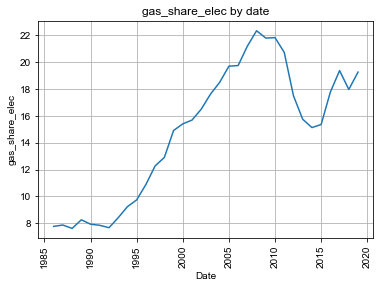

In [49]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=bb['gas_share_elec']
sns.lineplot(x=bb["year"], y=x1, data=bb)
sns.set(rc={'figure.figsize':(15,10)})

plt.title("gas_share_elec by date")
plt.xlabel("Date")
plt.ylabel("gas_share_elec")
plt.grid(True)

for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)
plt.show()

In [50]:
t1=df[df['country']=='Europe'][['hydro_share_elec','nuclear_share_elec',
'wind_share_elec','year']][df['year']>1985]

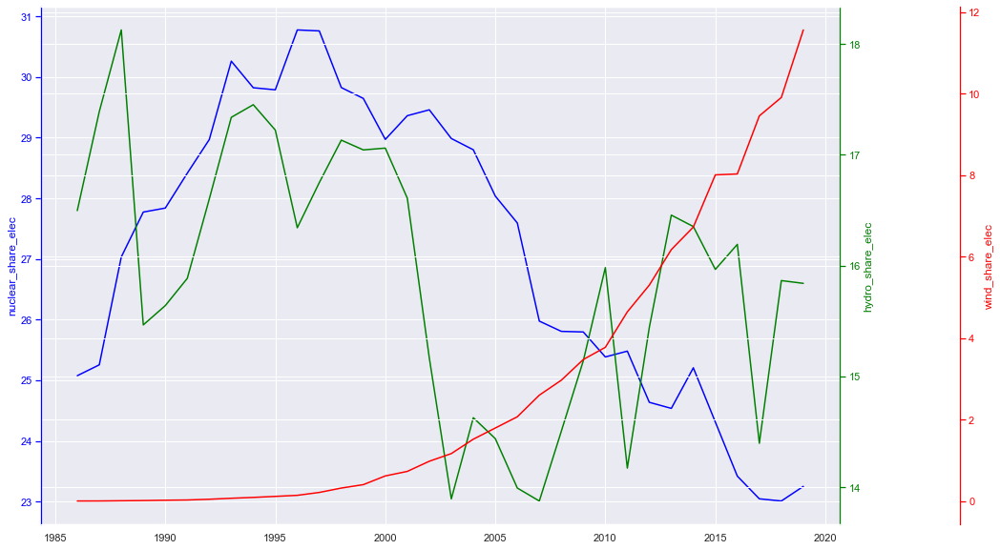

In [51]:

import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

years = t1.year
first = t1.nuclear_share_elec
second = t1.hydro_share_elec
third = t1.wind_share_elec

ax1.plot(years,first,color="blue")

ax2 = ax1.twinx()
ax2.plot(years,second,color="green")

ax3 = ax1.twinx()
ax3.plot(years,third,color="red")
#ax3.spines['right'].set_position(('outward',60))
ax3.spines['right'].set_position(('axes',1.15))

ax1.set_ylabel("nuclear_share_elec",color="blue")
ax2.set_ylabel("hydro_share_elec",color="green")
ax3.set_ylabel("wind_share_elec",color="red")

ax1.tick_params(axis='y',colors="blue")
ax2.tick_params(axis='y',colors="green")
ax3.tick_params(axis='y',colors="red")

ax2.spines['right'].set_color("green")
ax3.spines['right'].set_color("red")
ax3.spines['left'].set_color("blue")

plt.show()

#fig.tight_layout()

#Share of electricity consumption that comes from nuclear power

In [52]:
e1=df[df['country']=='Europe'][['biofuel_electricity','coal_electricity','fossil_electricity','year']][df['year']>1985]

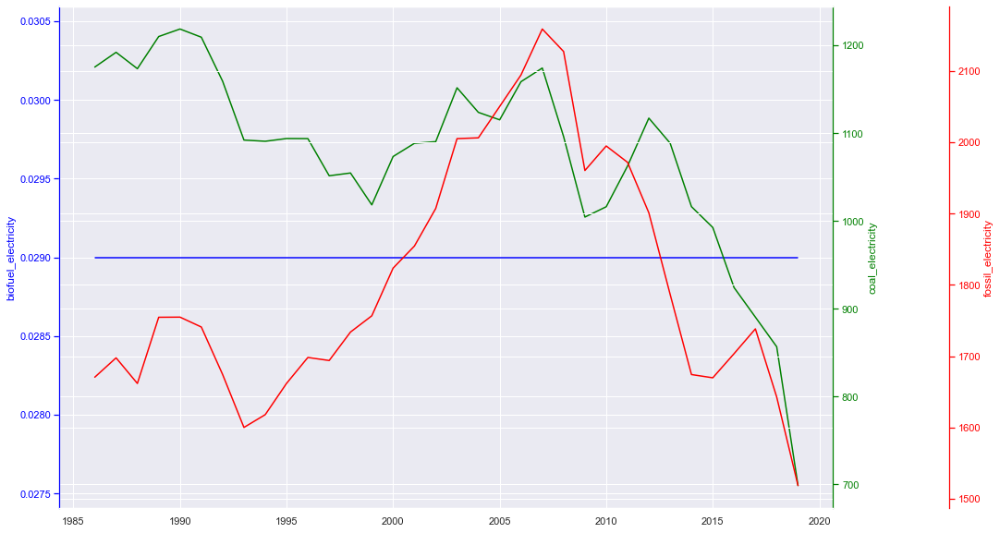

In [53]:

import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

years = e1.year
first = e1.biofuel_electricity
second = e1.coal_electricity
third = e1.fossil_electricity

ax1.plot(years,first,color="blue")

ax2 = ax1.twinx()
ax2.plot(years,second,color="green")

ax3 = ax1.twinx()
ax3.plot(years,third,color="red")
#ax3.spines['right'].set_position(('outward',60))
ax3.spines['right'].set_position(('axes',1.15))

ax1.set_ylabel("biofuel_electricity",color="blue")
ax2.set_ylabel("coal_electricity",color="green")
ax3.set_ylabel("fossil_electricity",color="red")

ax1.tick_params(axis='y',colors="blue")
ax2.tick_params(axis='y',colors="green")
ax3.tick_params(axis='y',colors="red")

ax2.spines['right'].set_color("green")
ax3.spines['right'].set_color("red")
ax3.spines['left'].set_color("blue")

plt.show()

#fig.tight_layout()

#Electricity generation from biofuels,coal,fosseil, measured in terawatt-hours

In [54]:
pr=df[df['country']=='Europe'][['gas_production','oil_production','coal_production','year']][df['year']>1985]

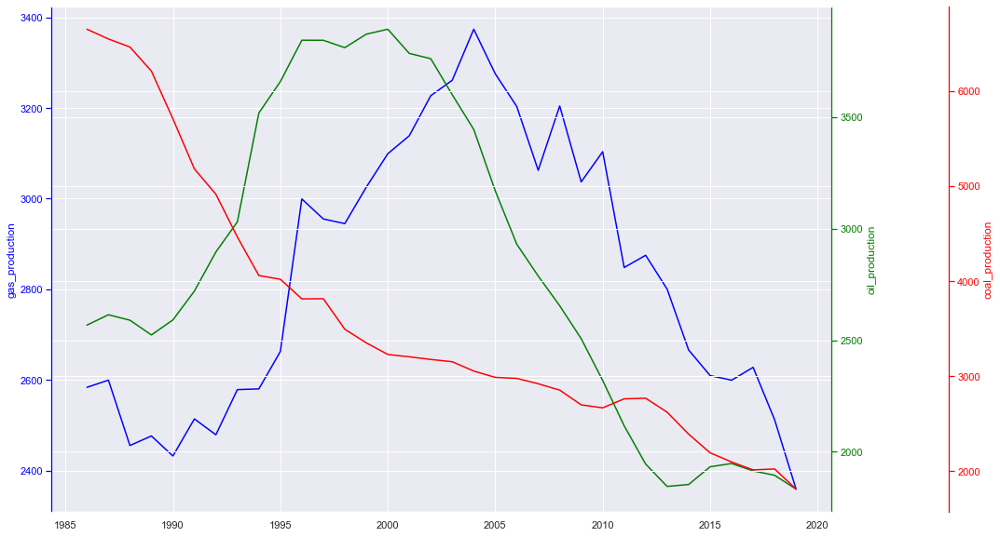

In [55]:

import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

years = pr.year
first = pr.gas_production
second = pr.oil_production
third = pr.coal_production

ax1.plot(years,first,color="blue")

ax2 = ax1.twinx()
ax2.plot(years,second,color="green")

ax3 = ax1.twinx()
ax3.plot(years,third,color="red")
#ax3.spines['right'].set_position(('outward',60))
ax3.spines['right'].set_position(('axes',1.15))

ax1.set_ylabel("gas_production",color="blue")
ax2.set_ylabel("oil_production",color="green")
ax3.set_ylabel("coal_production",color="red")

ax1.tick_params(axis='y',colors="blue")
ax2.tick_params(axis='y',colors="green")
ax3.tick_params(axis='y',colors="red")

ax2.spines['right'].set_color("green")
ax3.spines['right'].set_color("red")
ax3.spines['left'].set_color("blue")

plt.show()

#fig.tight_layout()

#Coal,oil,gas production, measured in terawatt-hours

In [56]:
ec=df[df['country']=='Europe'][['coal_consumption','fossil_fuel_consumption','gas_consumption','year']][df['year']>1985]

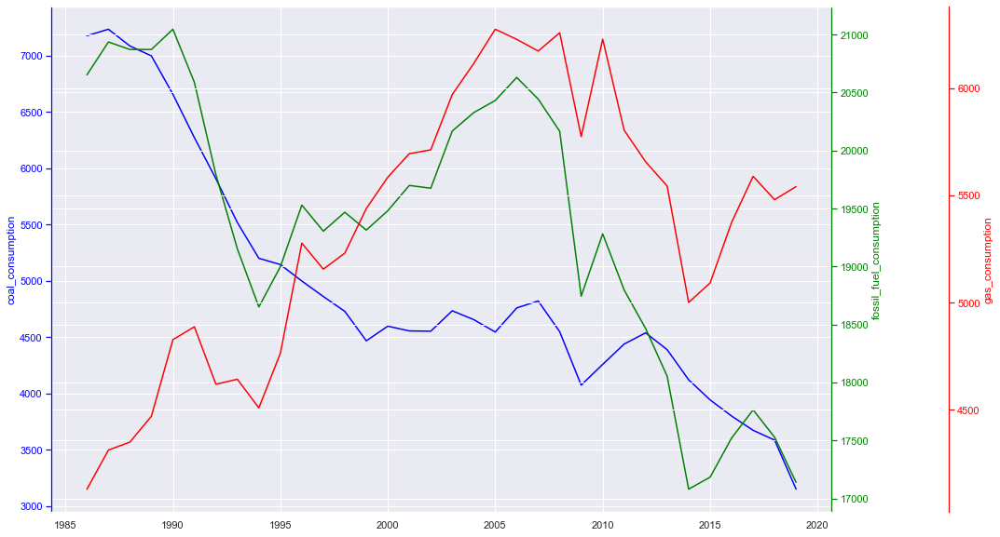

In [57]:

import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

years = ec.year
first = ec.coal_consumption
second = ec.fossil_fuel_consumption
third = ec.gas_consumption

ax1.plot(years,first,color="blue")

ax2 = ax1.twinx()
ax2.plot(years,second,color="green")

ax3 = ax1.twinx()
ax3.plot(years,third,color="red")
#ax3.spines['right'].set_position(('outward',60))
ax3.spines['right'].set_position(('axes',1.15))

ax1.set_ylabel("coal_consumption",color="blue")
ax2.set_ylabel("fossil_fuel_consumption",color="green")
ax3.set_ylabel("gas_consumption",color="red")

ax1.tick_params(axis='y',colors="blue")
ax2.tick_params(axis='y',colors="green")
ax3.tick_params(axis='y',colors="red")

ax2.spines['right'].set_color("green")
ax3.spines['right'].set_color("red")
ax3.spines['left'].set_color("blue")

plt.show()

#fig.tight_layout()

#Primary energy consumption from coal,gas,fossil, measured in terawatt-hours

In [58]:
df.columns.tolist()

['iso_code',
 'country',
 'year',
 'coal_prod_change_pct',
 'coal_prod_change_twh',
 'gas_prod_change_pct',
 'gas_prod_change_twh',
 'oil_prod_change_pct',
 'oil_prod_change_twh',
 'energy_cons_change_pct',
 'energy_cons_change_twh',
 'biofuel_share_elec',
 'biofuel_elec_per_capita',
 'biofuel_cons_change_pct',
 'biofuel_share_energy',
 'biofuel_cons_change_twh',
 'biofuel_consumption',
 'biofuel_cons_per_capita',
 'carbon_intensity_elec',
 'coal_share_elec',
 'coal_cons_change_pct',
 'coal_share_energy',
 'coal_cons_change_twh',
 'coal_consumption',
 'coal_elec_per_capita',
 'coal_cons_per_capita',
 'coal_production',
 'coal_prod_per_capita',
 'electricity_generation',
 'biofuel_electricity',
 'coal_electricity',
 'fossil_electricity',
 'gas_electricity',
 'hydro_electricity',
 'nuclear_electricity',
 'oil_electricity',
 'other_renewable_electricity',
 'other_renewable_exc_biofuel_electricity',
 'renewables_electricity',
 'solar_electricity',
 'wind_electricity',
 'energy_per_gdp',
 '

In [59]:
re=df[df['country']=='Europe'][['coal_consumption', 'oil_consumption' ,'gas_consumption','solar_consumption', 'wind_consumption','year']]

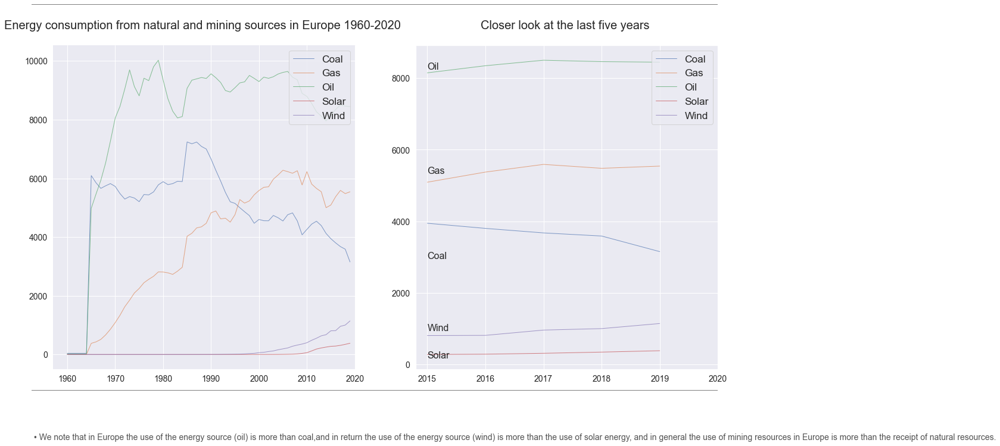

In [60]:
we=re.copy()
# we=we.iloc[:, [1,2,23,54,85,111,119]]
we=we[(we['year'] >= 1960) & (we['year'] <= 2020)]

#Using median methon to avoid outliers.

we=we.groupby(by ='year', axis=0, as_index=False).median()

we.rename(columns = {'coal_consumption': 'Coal', 'gas_consumption': 'Gas', 'oil_consumption' : 'Oil', 'solar_consumption' :'Solar', 'wind_consumption': 'Wind'}, inplace=True)

sources = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind']

we = pd.melt(we, id_vars='year', 
             value_vars=sources, 
             var_name='Energy source', 
             value_name='Share of primary energy consumption')

fig, axes = plt.subplots(1,2, figsize=(20, 10))
sns.set_style(style='darkgrid')

#Creating the first plot with 1990-2020 data

for i in sources:
    axes[0].plot(we[we['Energy source'] == i]['year'], 
            we[we['Energy source'] == i]['Share of primary energy consumption'], 
            alpha =0.7, 
            linewidth =1, 
            fillstyle='full')


# Second plot with data on the last decade with the closer look at the renewable and lower carbon sources exclusively.

rlcsources = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind']

we1=we[(we['year'] >= 2015)&(we['year']<=2020)]  
we1.rename(columns = {'biofuel_share_energy': 'Biofuel', 'coal_share_energy': 'Coal', 'gas_share_energy': 'Gas', 'hydro_share_energy' : 'Hydro', 'nuclear_share_energy' : 'Nuclear', 'oil_share_energy' : 'Oil', 'solar_share_energy' :'Solar', 'wind_share_energy': 'Wind'}, inplace=True)

we1= we1[we1['Energy source'].isin(rlcsources)]

for j in rlcsources:
    axes[1].plot(we1[we1['Energy source'] == j]['year'], 
            we1[we1['Energy source'] == j]['Share of primary energy consumption'], 
            alpha=0.7, 
            linewidth=1)
year_start, year_end = 2015, 2020
names = we1[['Energy source', 'Share of primary energy consumption']][we1['year'] == year_end -1]

ad=0
for i, value in names.itertuples(index=False):
    axes[1].text(x=year_start, y=value + ad, s=i, va="top", size=16)
    ad+=0.1
    
#General settings

axes[0].set_title('Energy consumption from natural and mining sources in Europe 1960-2020 \n', size=20)
axes[1].set_title('Closer look at the last five years \n', size=20)
axes[0].spines[['top','right','left']].set_visible(False)

axes[1].set_xticks(np.arange(year_start, year_end +1))
axes[0].set_xlim([None, year_end + 0.1])

axes[0].legend(sources, loc='upper right', fontsize='x-large')
axes[1].legend(rlcsources, loc='upper right', fontsize='x-large')

axes[0].add_patch(plt.Rectangle((0.1,0.075),              
                           0.8,                     
                           0.002,                      
                           facecolor='grey', 
                           transform=fig.transFigure, 
                           clip_on=False, 
                           linewidth = 0))

axes[0].add_patch(plt.Rectangle((0.1,0.975),              
                           0.8,                     
                           0.002,                      
                           facecolor='grey', 
                           transform=fig.transFigure, 
                           clip_on=False, 
                           linewidth = 0))

axes[0].text(x=0.1, y=-0.04, s=" • We note that in Europe the use of the energy source (oil) is more than coal,and in return the use of the energy source (wind) is more than the use of solar energy, and in general the use of mining resources in Europe is more than the receipt of natural resources.", 
             transform=fig.transFigure, 
             ha='left', 
             fontsize=14, alpha=.8)

axes[0].xaxis.set_tick_params(labelsize=14) 
axes[1].xaxis.set_tick_params(labelsize=14) 
axes[0].yaxis.set_tick_params(labelsize=14) 
axes[1].yaxis.set_tick_params(labelsize=14) 


In [61]:
g1=df[df['country']=='Europe'][['solar_share_energy','year']][df['year']>1985]

Text(0.5, 1.0, 'solar_share_energy')

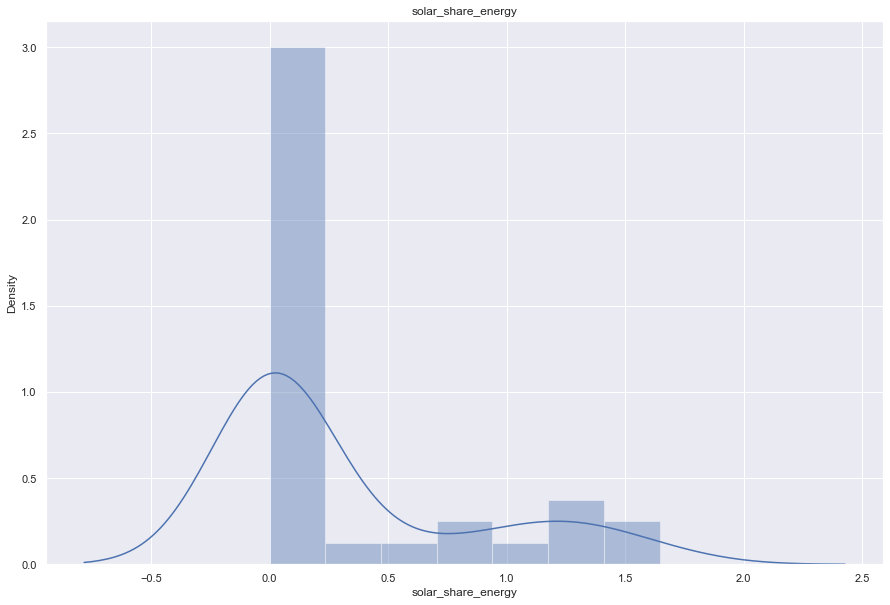

In [62]:
# distribution of solar_elec_per_capita
sns.distplot(g1['solar_share_energy'])
plt.title('solar_share_energy')

# Africa

In [63]:
Africa = ['Algeria',
'Angola',
'Benin',
'Botswana',
'Burkina Faso',
'Burundi',
'Cabo Verde',
'Cameroon',
'Central African Republic',
'Chad',
'Comoros',
'Congo',
'Democratic Republic of the Congo',
'Djibouti',
'Egypt',
'Equatorial Guinea',
'Eritrea',
'Eswatini',
'Ethiopia',
'Gabon',
'Gambia',
'Ghana',
'Guinea',
'Guinea-Bissau',
"Ivory Coast",
'Kenya',
'Lesotho',
'Liberia',
'Libya',
'Madagascar',
'Malawi',
'Mali',
'Mauritania',
'Mauritius',
'Morocco',
'Mozambique',
'Namibia',
'Niger',
'Nigeria',
'Rwanda',
'Sao Tome',
'Senegal',
'Seychelles',
'Sierra Leone',
'Somalia',
'South Africa',
'South Sudan',
'Sudan',
'Tanzania',
'Togo',
'Tunisia',
'Uganda',
'Zambia',
'Zimbabwe',
'Territories of Africa',
'Canary Islands',
'Ceuta',
'French Southern',
'Madeira',
'Mayotte',
'Melilla',
'Pelagie Islands',
'Plazas de Soberania',
'Reunion',
'Saint Helena',' Ascension',
'Socotra Archipelago']

# Asia

In [64]:
Asia = ['Afghanistan',
'Armenia' ,
'Azerbaijan',
'Bahrain',
'Bangladesh',
'Bhutan'
,'British Indian Ocean Territory'
,'Brunei'
,'Cambodia'
,'China'
,'Cyprus', 
'Georgia' ,
'Hong Kong' ,
'India',
'Indonesia',
'Iran',
'Iraq',
'Japan',
'Jordan',
'Kazakhstan',
'Kuwait',
'Kyrgyzstan',
'Laos',
'Lebanon',
'Macau',
'Malaysia'
,'Maldives'
,'Mongolia'
,'Myanmar'
,'Nepal'
,'North Korea'
,'Oman'
,'Pakistan'
,'Palestine'
,'Philippines',
'Qatar',

'Saudi Arabia',
'Singapore',
'South Korea',
'Sri Lanka',
'Syria',
'Taiwan',
'Tajikistan',
'Thailand',
'Timor-Leste',
'East Timor',
'Turkmenistan',
'United Arab Emirates',
'Uzbekistan',
'Vietnam',
'Yemen']

# Europe

In [65]:
Europe = ['Albania'
,'Andorra'
,'Austria'
,'Belarus'
,'Belgium'
,'Bosnia'
,'Bulgaria'
,'Croatia'
,'Cyprus' 
,'Czechia'
,'Denmark'
,'Estonia'
,'Finland'
,'France'
,'Germany'
,'Greece'
,'Hungary'
,'Iceland'
,'Ireland'
,'Italy'
,'Latvia'
,'Liechtenstein'
,'Lithuania'
,'Luxembourg'
,'Malta'
,'Moldova'
,'Monaco'
,'Montenegro'
,'Netherlands'
,'North Macedonia'
,'Norway'
,'Poland'
,'Portugal'
,'Romania'
,'Russia'
,'San Marino'
,'Serbia'
,'Slovakia'
,'Slovenia'
,'Spain'
,'Sweden'
,'Switzerland'
,'Turkey' 
,'Ukraine'
,'United Kingdom'
,'Vatican City' 
,'Holy']

# North_America

In [66]:
North_America = ['Antigua'
,'Bahamas'
,'Barbados'
,'Belize'
,'Canada'
,'Costa Rica'
,'Cuba'
,'Dominica'
,'Dominican Republic'
,'El Salvador'
,'Grenada'
,'Guatemala'
,'Haiti'
,'Honduras'
,'Jamaica'
,'Mexico'
,'Nicaragua'
,'Panama'
,'Saint Kitts'
,'Saint Lucia'
,'Saint Vincent'
,'Trinidad'
,'United States of America'
,'USA']

# Australia

In [67]:
Australia = ['Australia'
,'Fiji'
,'Kiribati'
,'Marshall Islands'
,'Micronesia'
,'Nauru'
,'New Zealand'
,'Palau'
,'Papua New Guinea'
,'Samoa'
,'Solomon Islands'
,'Tonga'
,'Tuvalu'
,'Vanuatu']

# South America

In [68]:
South_America = ['Argentina'
,'Bolivia'
,'Brazil'
,'Chile'
,'Colombia'
,'Ecuador'
,'Guyana'
,'Paraguay'
,'Peru'
,'Suriname'
,'Uruguay'
,'Venezuela']

# Antarctica

In [69]:
Antarctica = ['Adélie Land'
,'Argentine Antarctica' 
,'Australian Antarctic Territory' 
,'British Antarctic Territory' 
,'Chilean Antarctic Territory' 
,'Peter I Island' 
,'Queen Maud Land' 
,'Ross Dependency' ]

In [70]:
continent = [] #Add column
for x in df['country']:
    if x in Africa: continent.append("Africa")
    elif x in Asia: continent.append("Asia")
    elif x in Europe: continent.append("Europe")
    elif x in North_America: continent.append("North_America")
    elif x in Australia: continent.append("Australia")
    elif x in South_America: continent.append("South_America")
    elif x in Antarctica: continent.append("Antarctica")
    else : continent.append("Other country in all region")
df['continent'] = continent

In [71]:
df.continent.value_counts()

Asia                           3904
Africa                         3717
Other country in all region    3704
Europe                         3360
South_America                  1207
North_America                  1043
Australia                       497
Name: continent, dtype: int64

In [72]:
df.head(1)

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita,continent
0,AFG,Afghanistan,1900,180.00,0.00,0.00,0.00,833.33,0.00,12.34,...,0.00,"19,494,799,360.00",0.00,170.00,0.00,0.00,0.00,0.00,0.00,Asia


In [73]:
box1=df[df['continent']=='Africa'][['renewables_consumption', 'hydro_consumption','wind_consumption']]

<AxesSubplot:>

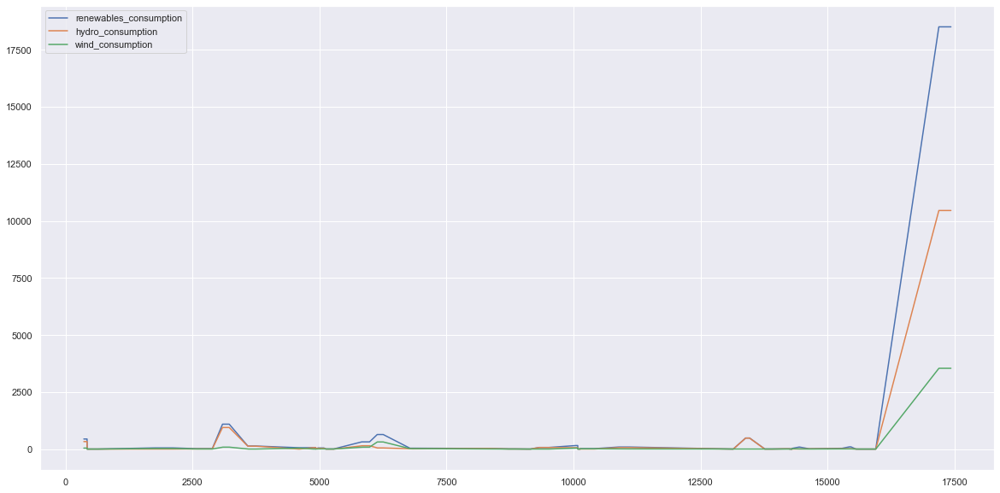

In [74]:
box1.plot(figsize=(20,10))

<AxesSubplot:xlabel='continent', ylabel='wind_consumption'>

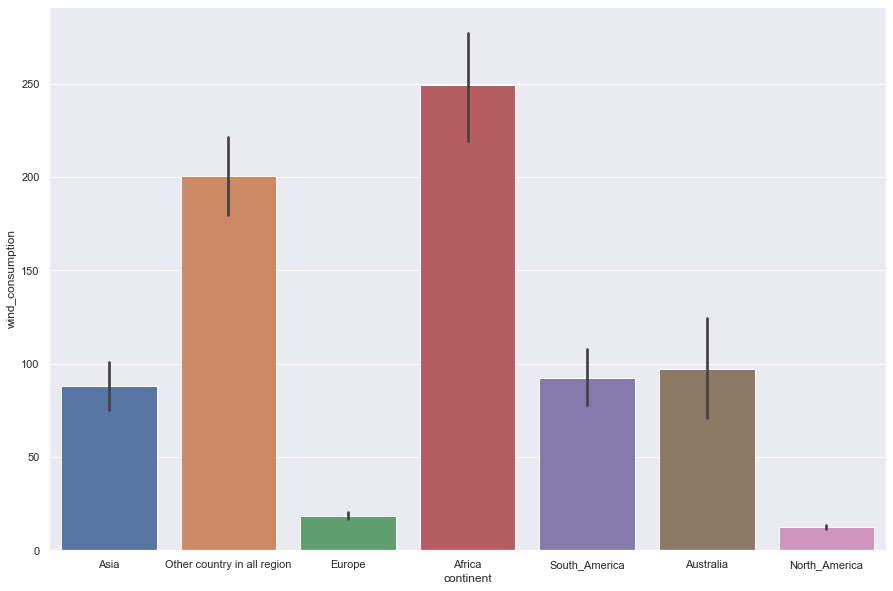

In [75]:
sns.barplot(data=df, x='continent', y='wind_consumption')

In [76]:
box=df[df['country']=='Africa'][['solar_elec_per_capita','solar_consumption','year']]

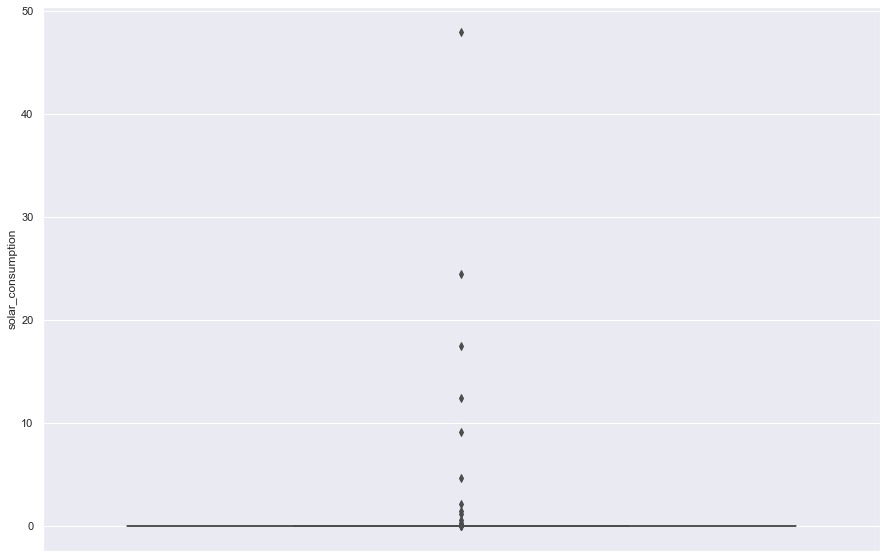

In [77]:
sns.boxplot( y=box['solar_consumption'] )
plt.show()

In [78]:
box.solar_consumption.max()

47.984

In [79]:
fig = px.choropleth(
    df,
    locations='country', 
    locationmode='USA-states', 
    scope='africa',                    
    color= 'fossil_energy_per_capita',
    color_continuous_scale="blues",
)
fig.add_scattergeo(
    locations=df['country'],
    locationmode='USA-states', 
    text=df[ 'fossil_energy_per_capita'],
    mode='text',
)


In [80]:
fig=px.choropleth(data_frame=df,locations='country',locationmode='country names',color='low_carbon_consumption')
fig.show()

In [81]:
fig=px.choropleth(data_frame=df,locations='country',locationmode='country names',color='gas_consumption')
fig.show()

In [82]:
fig=px.choropleth(data_frame=df,locations='country',locationmode='country names',color='oil_consumption')
fig.show()

In [83]:
# wind energy by all capitals per years 

#import plotly.express to make visual interactive
import plotly.express as px

# Focusing on columns with data on annual percentage change in energy sources consumption starting year 1990
consumption=df.copy()

# consumption=consumption.iloc[:, [1, 2, 9, 13, 20, 43, 51, 60, 69, 75, 82, 108, 106, 92, 98, 114, 102, 41-42]]
consumption=consumption[consumption['year']>=2000]

# Central America removed due to it is the part of 'South and Central America' value.

regions=[ 'South America','North_America','Europe','Asia','Australia','Africa','Antarctica']

consumption=consumption[consumption['continent'].isin(regions)]

fig = px.bar(consumption, 
             x='continent', y='oil_cons_change_pct', 
             color='continent',
             animation_frame='year', 
             animation_group='continent',
             range_y=[-100,100], 
             labels={'energy_cons_change_pct': 'Energy consumption change, %'}, 
             title='fossil_cons_change_pct')

fig.add_vrect(x0=11.5, x1=10.5)
plt.tight_layout()
fig.show()

<Figure size 1080x720 with 0 Axes>

In [84]:
# to make data easy to understand we segment coal_share_energy column  
coal_share_energy_segment = []
for x in df['coal_share_energy']:
    if x <= 10: coal_share_energy_segment.append("0<10")
    elif x > 10  and x <= 20 :  coal_share_energy_segment.append("10-20")
    elif x > 20  and x <= 30 :  coal_share_energy_segment.append("20-30")
    elif x > 30  and x <= 40 :  coal_share_energy_segment.append('30-40')
    elif x > 40  and x <= 50 :  coal_share_energy_segment.append("40-50")
    elif x > 50  and x <= 60 :  coal_share_energy_segment.append("50-60")
    elif x > 60  and x <= 70 :  coal_share_energy_segment.append('60-70')
    elif x > 70  and x <= 80 :  coal_share_energy_segment.append('70-80')
    else : coal_share_energy_segment.append("greater thsn 80")
df['coal_share_energy_segment'] = coal_share_energy_segment

In [85]:
df1=df[df['continent']=='Europe'][['coal_share_energy', 'coal_production','coal_share_energy_segment']]

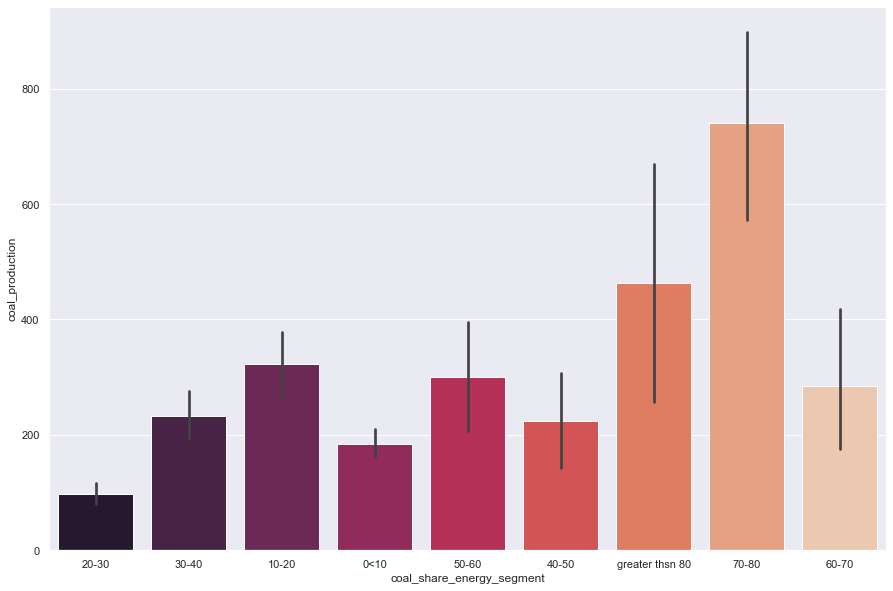

In [86]:
# mean
sns.barplot(data = df1,x = df1.coal_share_energy_segment , y = df1.coal_production  , palette='rocket' )
plt.show()
#coal_share_elec by coal_prod_change_twh 
#The ratio between coal production and the proportion of coal in electricity production

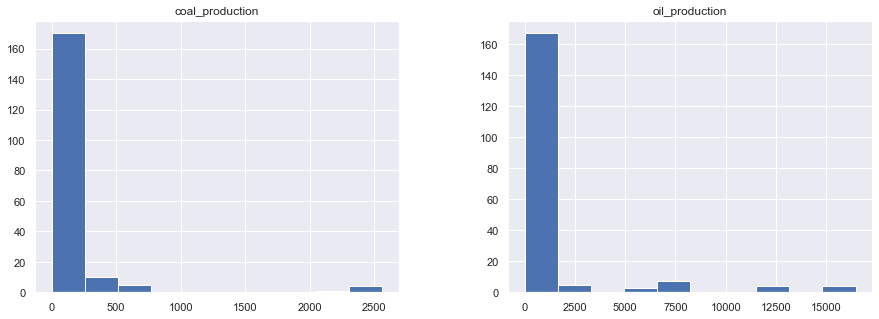

In [87]:
df9=df[df['continent']=='Europe'][['coal_production', 'oil_production']][df['year']>2015]                                                                    
df9.hist(figsize=(15,5))
plt.show()
#HISTGRAM 
# 1

In [88]:
# to make data easy to understand we segment gas_share_elec column 
gas_share_elec_segment = []
for x in df['gas_share_elec']:
    if x <= 10: gas_share_elec_segment.append("0<10")
    elif x > 10  and x <= 20 :  gas_share_elec_segment.append("10-20")
    elif x > 20  and x <= 30 :  gas_share_elec_segment.append("20-30")
    elif x > 30  and x <= 40 :  gas_share_elec_segment.append('30-40')
    elif x > 40  and x <= 50 :  gas_share_elec_segment.append("40-50")
    elif x > 50  and x <= 60 :  gas_share_elec_segment.append("50-60")
    elif x > 60  and x <= 70 :  gas_share_elec_segment.append('60-70')
    elif x > 70  and x <= 80 :  gas_share_elec_segment.append('70-80')
    elif x > 80  and x <= 90 :  gas_share_elec_segment.append("80-90")
    elif x > 90  and x <= 100 :  gas_share_elec_segment.append('90-100')
    else : gas_share_elec_segment.append("greater than 100")
df['gas_share_elec_segment'] = gas_share_elec_segment

In [89]:
df2=df[df['continent']=='Europe'][[ 'gas_production','gas_share_elec_segment']]

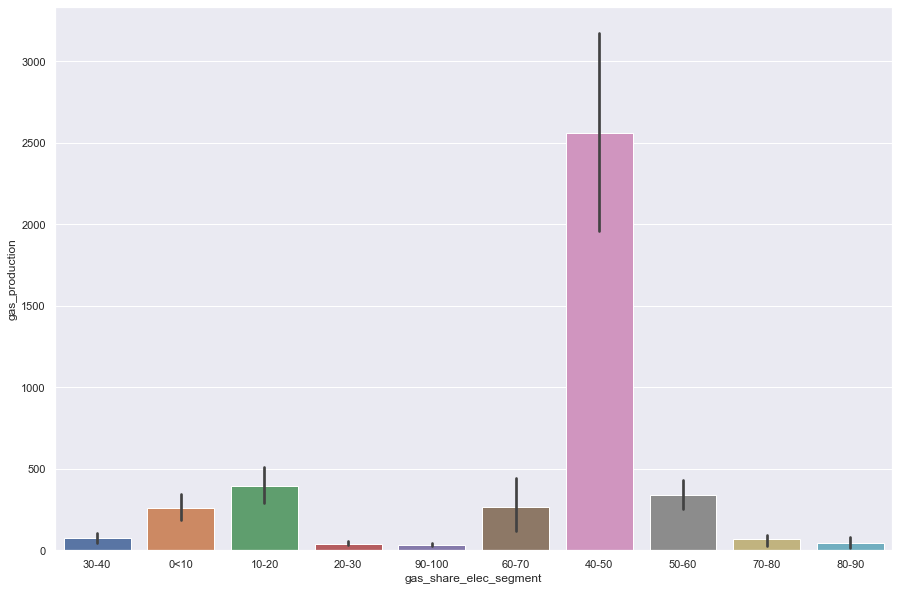

In [90]:
sns.barplot(data = df2,x = df2.gas_share_elec_segment , y = df2.gas_production   )
plt.show()

In [91]:
# to make data easy to understand we segment oil_share_elec column
oil_share_elec_segment = []
for x in df['oil_share_elec']:
    if x <= 10: oil_share_elec_segment.append("0<10")
    elif x > 10  and x <= 20 :  oil_share_elec_segment.append("10-20")
    elif x > 20  and x <= 30 :  oil_share_elec_segment.append("20-30")
    elif x > 30  and x <= 40 :  oil_share_elec_segment.append('30-40')
    elif x > 40  and x <= 50 :  oil_share_elec_segment.append("40-50")
    elif x > 50  and x <= 60 :  oil_share_elec_segment.append("50-60")
    elif x > 60  and x <= 70 :  oil_share_elec_segment.append('60-70')
    elif x > 70  and x <= 80 :  oil_share_elec_segment.append('70-80')
    elif x > 80  and x <= 90 :  oil_share_elec_segment.append("80-90")
    elif x > 90  and x <= 100 :  oil_share_elec_segment.append('90-100')
    else : oil_share_elec_segment.append("greater than 100")
df['oil_share_elec_segment'] = oil_share_elec_segment

In [92]:
df3=df[df['continent']=='Europe'][['oil_share_elec', 'oil_production','oil_share_elec_segment']]

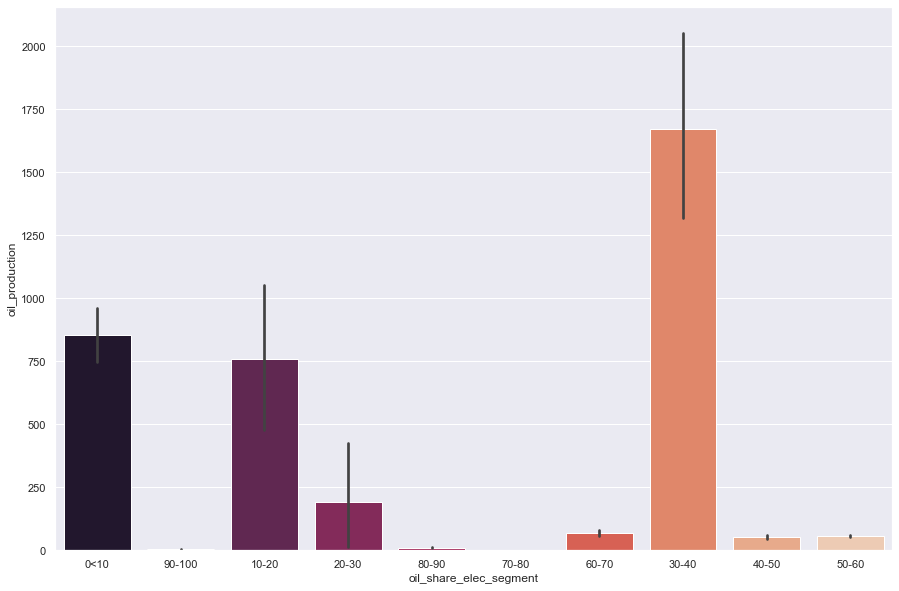

In [93]:
sns.barplot(data = df3,x = df3.oil_share_elec_segment , y = df3.oil_production  , palette='rocket' )
plt.show()

In [94]:
# to make data easy to understand we segment solar_share_elec column
solar_share_elec_segment = []
for x in df['solar_share_elec']:
    if x <= 5: solar_share_elec_segment.append("0<5")
    elif x > 5  and x <= 10 :  solar_share_elec_segment.append("5-10")
    elif x > 10  and x <= 15 :  solar_share_elec_segment.append("10-15")
    elif x > 15  and x <= 20 :  solar_share_elec_segment.append('15-20')
    else : solar_share_elec_segment.append("greater than 20")
df['solar_share_elec_segment'] = solar_share_elec_segment

In [95]:
df5=df[df['continent']=='Europe'][['solar_share_elec', 'solar_consumption','solar_share_elec_segment']]

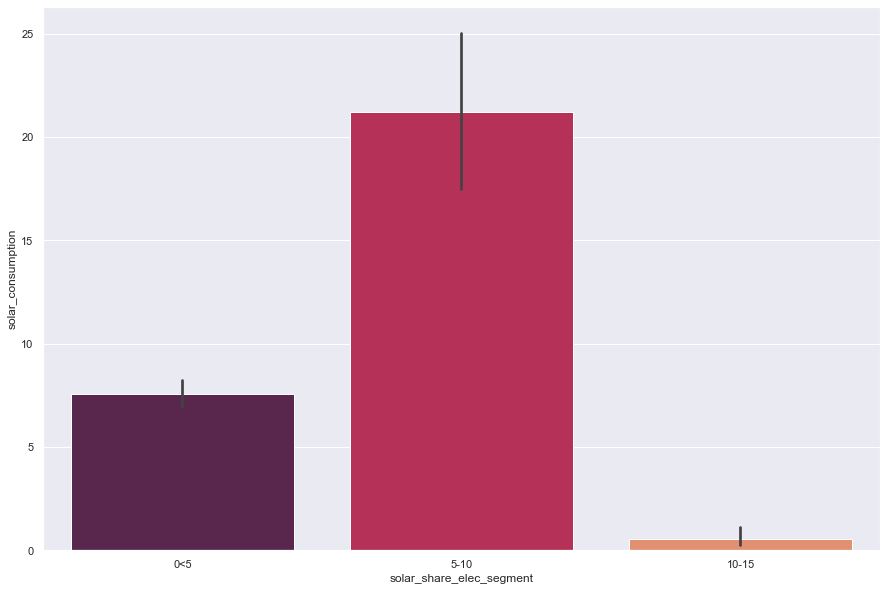

In [96]:
sns.barplot(data = df5,x = df5.solar_share_elec_segment , y = df5.solar_consumption  , palette='rocket' )
plt.show()

In [97]:
d = df[df['continent']=='Europe'][['population', 'year']][df['year']>1970]

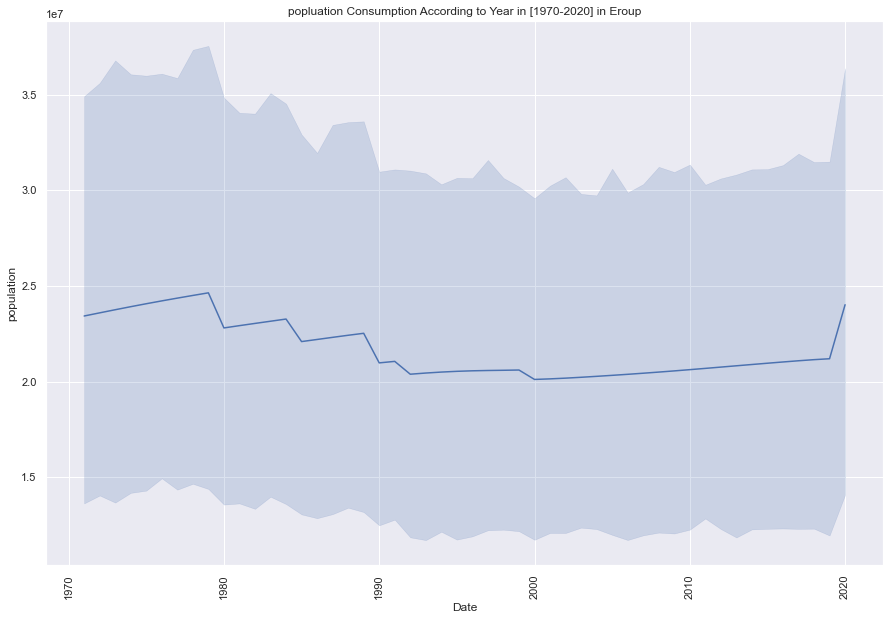

In [98]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=d['population']
sns.lineplot(x=d["year"], y=x1, data=d)
sns.set(rc={'figure.figsize':(10,10)})

plt.title('population')
plt.xlabel("Date")
plt.ylabel("population")
plt.grid(True)
for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)
plt.title("popluation Consumption According to Year in [1970-2020] in Eroup")
plt.show()

In [99]:
d1=df[df['continent']=='Europe'][['wind_share_energy','year']][df['year']>1990]

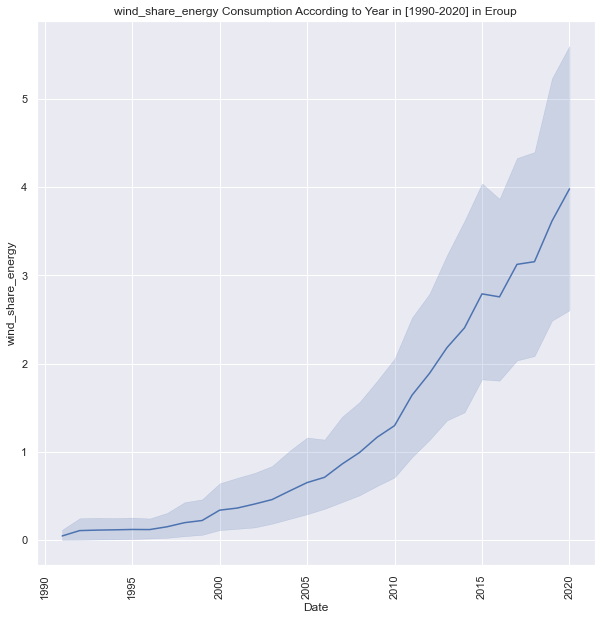

In [100]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=d1['wind_share_energy']
sns.lineplot(x=d1["year"], y=x1, data=d1)
sns.set(rc={'figure.figsize':(20,10)})

plt.title('wind_share_energy')
plt.xlabel("Date")
plt.ylabel("wind_share_energy")
plt.grid(True)
for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)


plt.title("wind_share_energy Consumption According to Year in [1990-2020] in Eroup")
plt.show()

In [101]:
d2=df[df['continent']=='Europe'][['renewables_share_energy','year']][df['year']>1970]

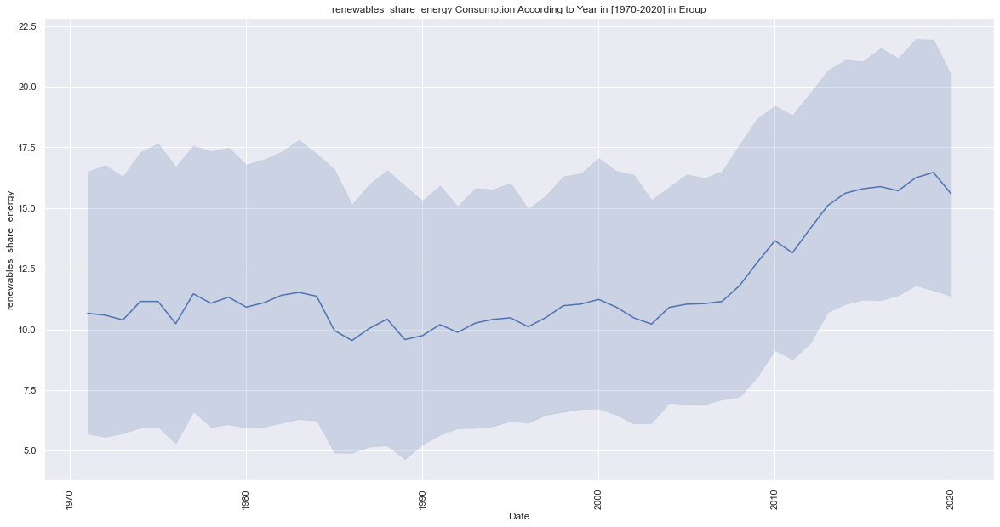

In [102]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=d2['renewables_share_energy']
sns.lineplot(x=d2["year"], y=x1, data=d2)
sns.set(rc={'figure.figsize':(20,10)})

plt.title('renewables_share_energy')
plt.xlabel("Date")
plt.ylabel("renewables_share_energy")
plt.grid(True)

for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)


plt.title("renewables_share_energy Consumption According to Year in [1970-2020] in Eroup")
plt.show()

In [103]:
d4=df[df['continent']=='Europe'][['coal_production','year']][df['year']>1990]

Text(0.5, 1.0, 'coal_production Consumption According to Year in [1990-2020]in Eroup')

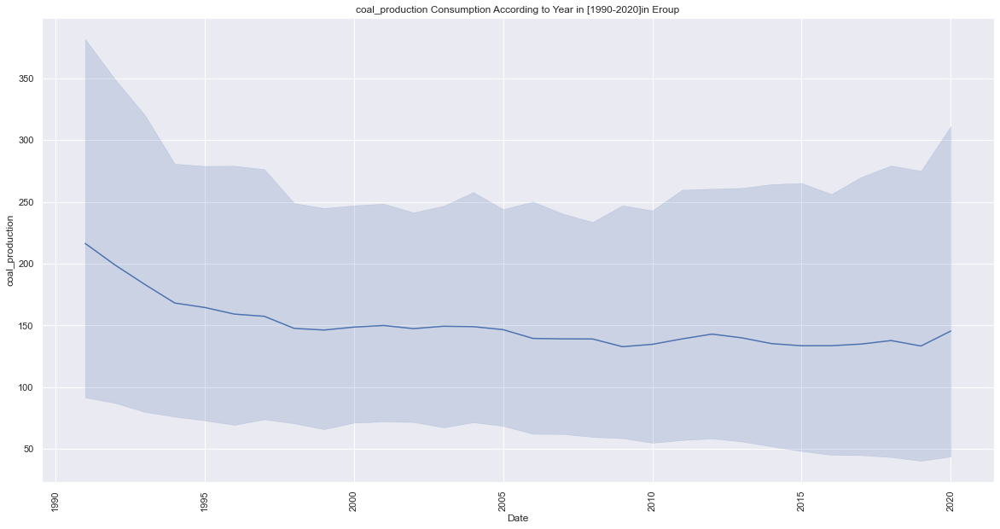

In [104]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=d4[ 'coal_production']
sns.lineplot(x=d4["year"], y=x1, data=d4)
sns.set(rc={'figure.figsize':(20,10)})

plt.title( 'coal_production')
plt.xlabel("Date")
plt.ylabel("coal_production")
plt.grid(True)
for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)


plt.title("coal_production Consumption According to Year in [1990-2020]in Eroup")
#intrested

In [105]:
d5=df[df['continent']=='Europe'][['fossil_share_energy','year']][df['year']>1970]

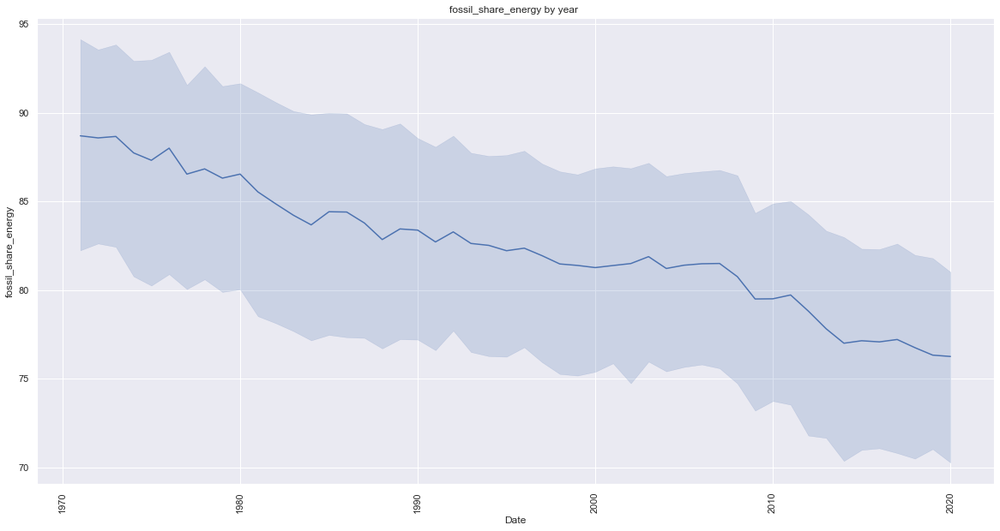

In [106]:
from matplotlib import style

fig = plt.figure()
ax1 = plt.subplot2grid((1,1), (0,0))

style.use('ggplot')
x1=d5[ 'fossil_share_energy']
sns.lineplot(x=d5["year"], y=x1, data=d5)
sns.set(rc={'figure.figsize':(20,10)})

plt.title( 'fossil_share_energy by year ')
plt.xlabel("Date")
plt.ylabel("fossil_share_energy")
plt.grid(True)
for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)
plt.show()

In [107]:
#drop in continent other country in all region

In [108]:
df.drop(df.index[(df['continent'] == "Other country in all region")],axis=0,inplace=True)

<AxesSubplot:xlabel='continent', ylabel='wind_share_energy'>

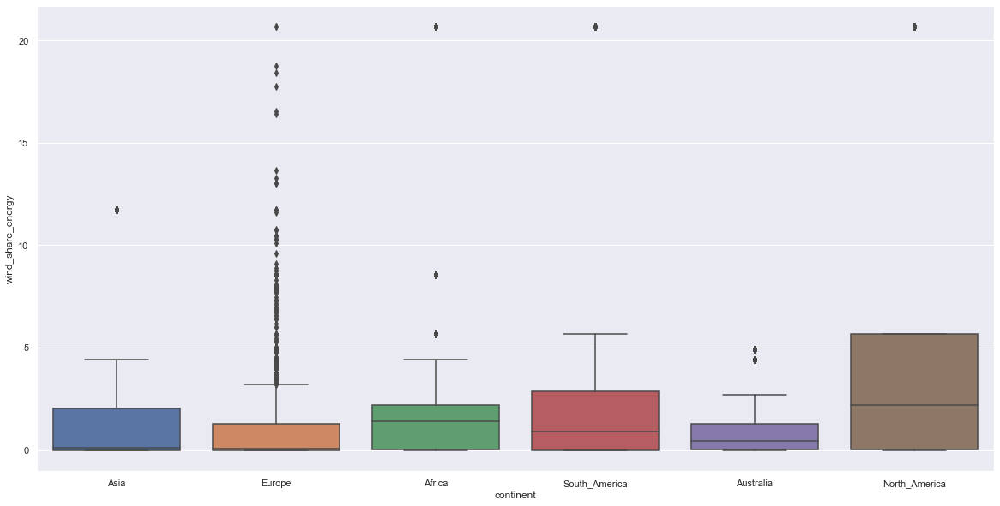

In [109]:
sns.boxplot(data=df, x='continent', y='wind_share_energy')

<AxesSubplot:xlabel='continent', ylabel='wind_consumption'>

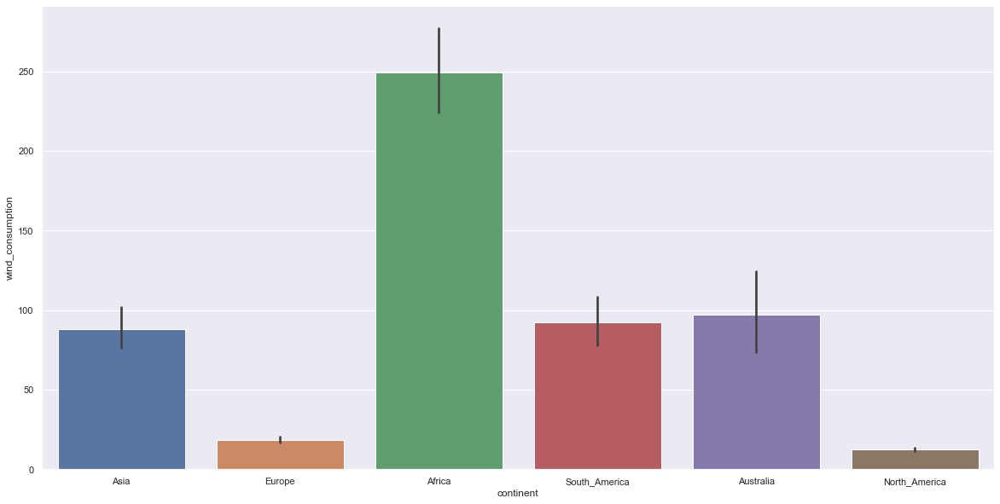

In [110]:
sns.barplot(data=df, x='continent', y='wind_consumption')

<AxesSubplot:xlabel='year', ylabel='wind_consumption'>

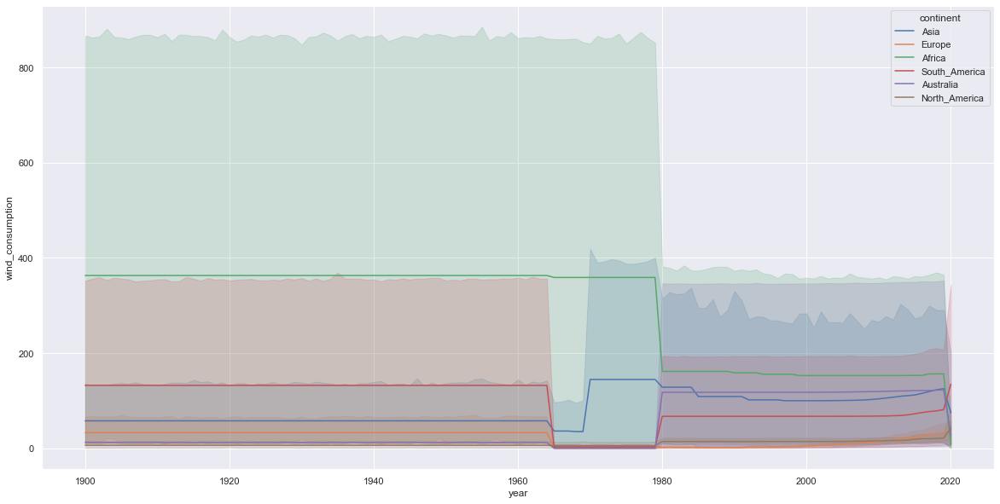

In [111]:
sns.lineplot(data=df, x="year", y='wind_consumption', hue='continent')

<AxesSubplot:xlabel='continent', ylabel='solar_consumption'>

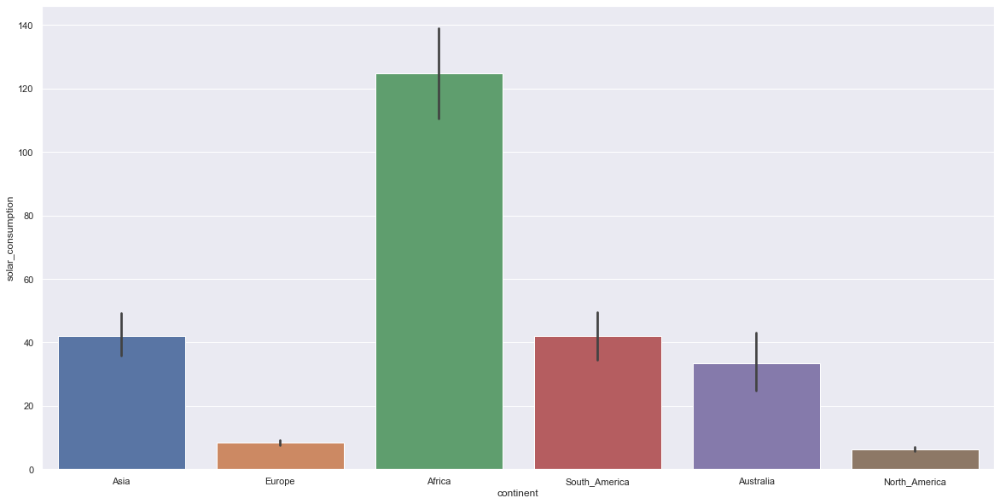

In [112]:
sns.barplot(data=df, x='continent', y='solar_consumption')

<AxesSubplot:xlabel='continent', ylabel='oil_consumption'>

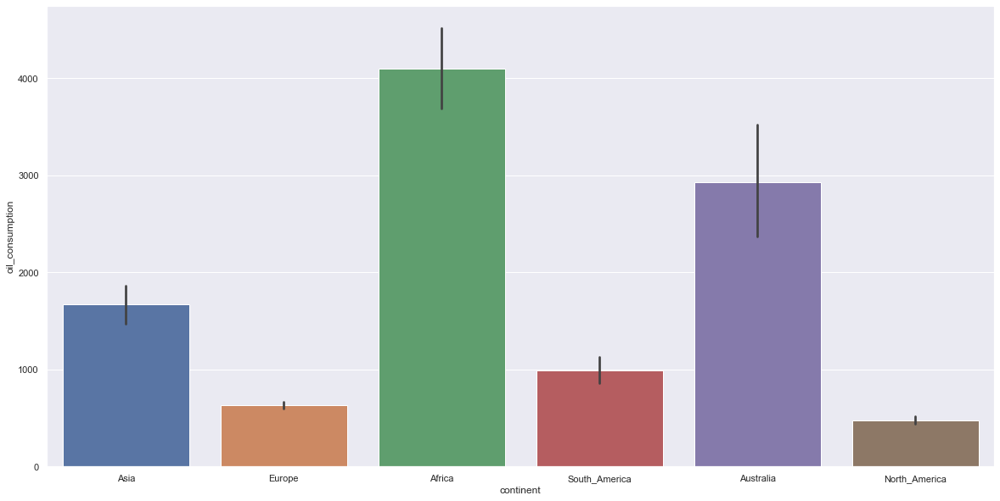

In [113]:
sns.barplot(data=df, x='continent', y='oil_consumption')

<AxesSubplot:xlabel='continent', ylabel='hydro_consumption'>

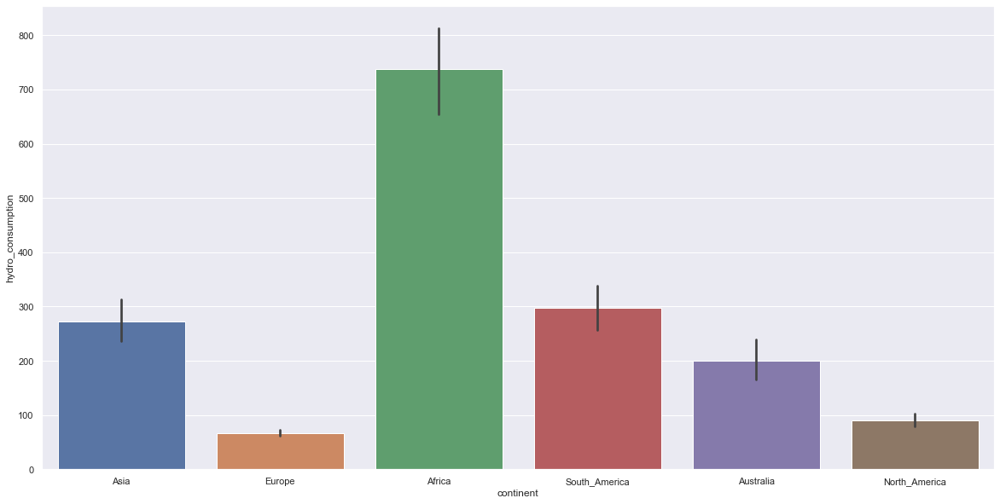

In [114]:
sns.barplot(data=df, x='continent', y='hydro_consumption')

<AxesSubplot:xlabel='continent', ylabel='nuclear_consumption'>

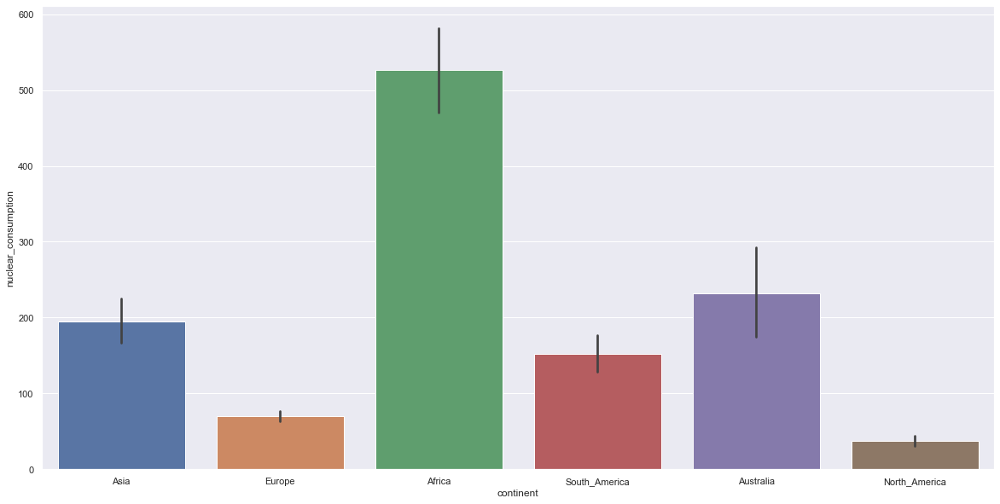

In [115]:
sns.barplot(data=df, x='continent', y='nuclear_consumption')

<AxesSubplot:xlabel='year', ylabel='solar_cons_change_pct'>

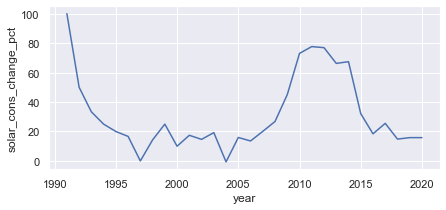

In [116]:
x_Switzerland = df[df['country']=='Switzerland'][['solar_cons_change_pct', 'year']][df['year']>1990]
plt.figure(figsize=(7, 3))
sns.lineplot(x = 'year', y = 'solar_cons_change_pct', data = x_Switzerland)

<AxesSubplot:xlabel='year', ylabel='solar_cons_change_pct'>

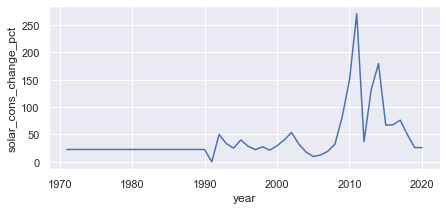

In [117]:
x_China = df[df['country']=='China'][['solar_cons_change_pct', 'year']][df['year']>1970]
plt.figure(figsize=(7, 3))
sns.lineplot(x = 'year', y = 'solar_cons_change_pct', data = x_China)

<AxesSubplot:xlabel='year', ylabel='solar_cons_change_pct'>

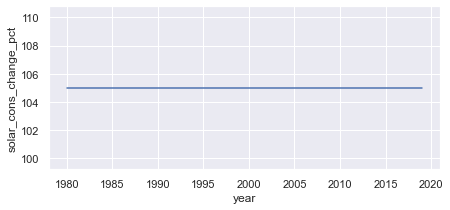

In [118]:
x_Kenya = df[df['country']=='Kenya'][['solar_cons_change_pct', 'year']][df['year']>1970]
plt.figure(figsize=(7, 3))
sns.lineplot(x = 'year', y = 'solar_cons_change_pct', data = x_Kenya)

<AxesSubplot:xlabel='year', ylabel='solar_cons_change_pct'>

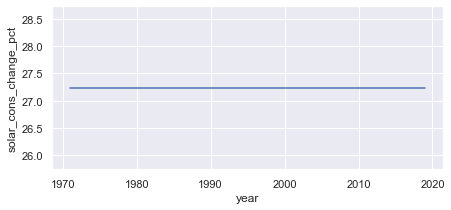

In [119]:
x_Niger = df[df['country']=='Niger'][['solar_cons_change_pct', 'year']][df['year']>1970]
plt.figure(figsize=(7, 3))
sns.lineplot(x = 'year', y = 'solar_cons_change_pct', data = x_Niger)

<AxesSubplot:xlabel='gas_prod_change_pct', ylabel='gas_cons_change_pct'>

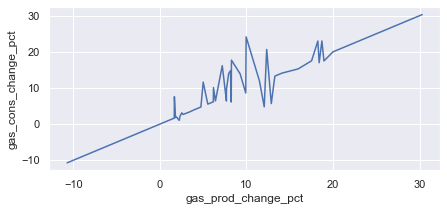

In [120]:
x_China = df[df['country']=='China'][['gas_cons_change_pct', 'gas_prod_change_pct']][df['year']>1970]
xx = x_China['gas_prod_change_pct']
yy = x_China['gas_cons_change_pct']
plt.figure(figsize=(7, 3))
sns.lineplot(x = xx, y = yy)

In [122]:
!pip install powerbiclient


[notice] A new release of pip available: 22.3.1 -> 23.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [123]:
from powerbiclient import Report
from IPython.display import IFrame
from io import StringIO
import pandas as pd
from ipywidgets import interact

In [124]:
import powerbiclient
import IPython
from IPython.display import display, HTML

In [125]:
# Import the DeviceCodeLoginAuthentication class to authenticate against Power BI
from powerbiclient.authentication import DeviceCodeLoginAuthentication

# Initiate device authentication
device_auth = DeviceCodeLoginAuthentication()
access_token=device_auth.get_access_token()

Performing device flow authentication. Please follow the instructions below.
To sign in, use a web browser to open the page https://microsoft.com/devicelogin and enter the code CZJBY2M8U to authenticate.

Device flow authentication successfully completed.
You are now logged in.


In [127]:
group_id ="42cacfb7-52a2-4a52-924b-434213579106"
report_id ="9eeec843-f3c6-4274-8541-c441e8685da8"

In [128]:
class PbiEmbedService:

    def get_embed_params_for_single_report(self, group_id,report_id, additional_dataset_id=None):
        '''Get embed params for a report and a workspace

        Args:
            workspace_id (str): Workspace Id
            report_id (str): Report Id
            additional_dataset_id (str, optional): Dataset Id different than the one bound to the report. Defaults to None.

        Returns:
            EmbedConfig: Embed token and Embed URL
        '''

        report_url = f'https://api.powerbi.com/v1.0/myorg/groups/{group_id}/reports/{report_id}'       
        api_response = requests.get(report_url, headers=self.get_request_header())

In [129]:
report = Report(group_id=group_id, report_id=report_id, auth=device_auth)
report

Report()

## model building

In [130]:
df['Amount of energy consumption']=(df.biofuel_consumption+df.coal_consumption+df.fossil_fuel_consumption+df.gas_consumption+df.hydro_consumption+df.low_carbon_consumption
      +df.nuclear_consumption+df.oil_consumption+df.other_renewable_consumption+df.renewables_consumption
      +df.solar_consumption+df.wind_consumption+df.primary_energy_consumption)


In [131]:
x = df[df['continent']=='Europe'][['Amount of energy consumption', 'population','gdp']]
x.head()

,Amount of energy consumption,population,gdp
240,"17,000.32","819,951.00","808,800,000.00"
241,"17,000.32","827,966.00","808,800,000.00"
242,"17,000.32","836,031.00","808,800,000.00"
243,"17,000.32","844,038.00","808,800,000.00"
244,"17,000.32","852,043.00","808,800,000.00"


In [132]:
y = x.pop('Amount of energy consumption')
y

240     17,000.32
241     17,000.32
242     17,000.32
243     17,000.32
244     17,000.32
           ...   
16244    6,898.88
16245    6,917.57
16246    6,925.56
16247    6,848.26
16248    6,848.26
Name: Amount of energy consumption, Length: 3360, dtype: float64

In [133]:
x.head()

,population,gdp
240,"819,951.00","808,800,000.00"
241,"827,966.00","808,800,000.00"
242,"836,031.00","808,800,000.00"
243,"844,038.00","808,800,000.00"
244,"852,043.00","808,800,000.00"


In [134]:
x.shape

(3360, 2)

In [135]:
r=x.iloc[0:5, :]
r

,population,gdp
240,"819,951.00","808,800,000.00"
241,"827,966.00","808,800,000.00"
242,"836,031.00","808,800,000.00"
243,"844,038.00","808,800,000.00"
244,"852,043.00","808,800,000.00"


In [136]:
y = np.array(y)
y

array([17000.319, 17000.319, 17000.319, ...,  6925.56 ,  6848.262,
        6848.262])

In [137]:
x = np.array(x)
x

array([[8.19951e+05, 8.08800e+08],
       [8.27966e+05, 8.08800e+08],
       [8.36031e+05, 8.08800e+08],
       ...,
       [6.71420e+07, 2.58000e+12],
       [6.75300e+07, 2.58000e+12],
       [6.75300e+07, 2.58000e+12]])

In [138]:
# # We should normalize the output at first to make the training fast
yf = (y-y.mean())/y.std()
yf

array([2.82514504, 2.82514504, 2.82514504, ..., 0.69681988, 0.68049043,
       0.68049043])

In [139]:
#!pip install xgboost

In [140]:
# Split the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(x, yf, test_size=0.2, random_state=42)

In [141]:
# Training the model
xgb_model = XGBRegressor(n_estimators=1000, learning_rate=0.1, early_stopping_rounds=20)
xgb_model.fit(X_train, y_train, eval_metric='mae', eval_set=[(X_test, y_test)])

[0]	validation_0-mae:0.91460
[1]	validation_0-mae:0.85438
[2]	validation_0-mae:0.80068
[3]	validation_0-mae:0.75291
[4]	validation_0-mae:0.70948
[5]	validation_0-mae:0.67142
[6]	validation_0-mae:0.63652
[7]	validation_0-mae:0.60417
[8]	validation_0-mae:0.57674
[9]	validation_0-mae:0.54983
[10]	validation_0-mae:0.52586
[11]	validation_0-mae:0.50696
[12]	validation_0-mae:0.48448
[13]	validation_0-mae:0.47068
[14]	validation_0-mae:0.45363
[15]	validation_0-mae:0.43377
[16]	validation_0-mae:0.42262
[17]	validation_0-mae:0.41304
[18]	validation_0-mae:0.39954
[19]	validation_0-mae:0.38710
[20]	validation_0-mae:0.38033
[21]	validation_0-mae:0.37002
[22]	validation_0-mae:0.36403
[23]	validation_0-mae:0.35677
[24]	validation_0-mae:0.34956
[25]	validation_0-mae:0.34047
[26]	validation_0-mae:0.33608
[27]	validation_0-mae:0.32490
[28]	validation_0-mae:0.31552
[29]	validation_0-mae:0.30684
[30]	validation_0-mae:0.30301
[31]	validation_0-mae:0.29682
[32]	validation_0-mae:0.29391
[33]	validation_0-ma

[268]	validation_0-mae:0.17557
[269]	validation_0-mae:0.17555
[270]	validation_0-mae:0.17553
[271]	validation_0-mae:0.17545
[272]	validation_0-mae:0.17541
[273]	validation_0-mae:0.17544
[274]	validation_0-mae:0.17546
[275]	validation_0-mae:0.17538
[276]	validation_0-mae:0.17533
[277]	validation_0-mae:0.17528
[278]	validation_0-mae:0.17529
[279]	validation_0-mae:0.17539
[280]	validation_0-mae:0.17527
[281]	validation_0-mae:0.17528
[282]	validation_0-mae:0.17522
[283]	validation_0-mae:0.17524
[284]	validation_0-mae:0.17500
[285]	validation_0-mae:0.17494
[286]	validation_0-mae:0.17490
[287]	validation_0-mae:0.17489
[288]	validation_0-mae:0.17487
[289]	validation_0-mae:0.17476
[290]	validation_0-mae:0.17470
[291]	validation_0-mae:0.17456
[292]	validation_0-mae:0.17459
[293]	validation_0-mae:0.17460
[294]	validation_0-mae:0.17454
[295]	validation_0-mae:0.17454
[296]	validation_0-mae:0.17435
[297]	validation_0-mae:0.17431
[298]	validation_0-mae:0.17434
[299]	validation_0-mae:0.17437
[300]	va

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=20,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [142]:
# y_hat, model predictions
xgb_predict = xgb_model.predict(X_test)
xgb_predict

array([ 0.3991331 , -0.73484343, -0.76696813, -0.32851267, -0.5782934 ,
       -0.27386102,  2.2547302 , -0.53427726,  0.3011554 , -0.6324244 ,
       -0.12190229, -0.5884377 ,  2.827143  , -0.5598324 ,  0.11481155,
       -0.6506244 , -0.45609137, -0.64009315,  0.46631262, -0.6447494 ,
        0.24028057,  0.74484223,  0.5547309 ,  0.3500631 ,  1.936718  ,
       -0.7449152 , -0.6799608 , -0.42779723, -0.574626  , -0.45776233,
        0.30123004,  2.3471887 ,  0.16365501, -0.7317893 , -0.32534036,
        2.2724538 , -0.746783  , -0.4842482 , -0.6707351 , -0.54019654,
        0.48048666, -0.5756356 , -0.74233896,  0.33472463, -0.7540243 ,
       -0.7255154 , -0.67835265, -0.39742008,  0.9554177 ,  4.5227427 ,
       -0.4391709 , -0.53520614, -0.55971557,  2.827143  , -0.5448289 ,
       -0.54164475, -0.45422804, -0.48528442, -0.43908876, -0.55193263,
        0.24637865, -0.56427485, -0.3803259 , -0.24485587, -0.51120013,
       -0.29294187,  2.827143  , -0.5725926 , -0.6222686 , -0.54

In [143]:
X_test[0]

array([7.69049500e+06, 1.91245312e+10])

In [144]:
xgb_model.predict([[819951,808800000]])

array([2.827143], dtype=float32)

In [145]:
# Model Evaluation on the test data
mae = round(mean_absolute_error(y_test, xgb_predict), 3)
mae

0.171

In [146]:
xgb_model.score(X_test, y_test)

0.8984659181493859

In [147]:
# Extract the errors (Y-Axis on the graph)
err = xgb_model.evals_result()['validation_0']['mae']

In [148]:
# The steps (X-Axis on the graph)
steps = list(range(len(err)))

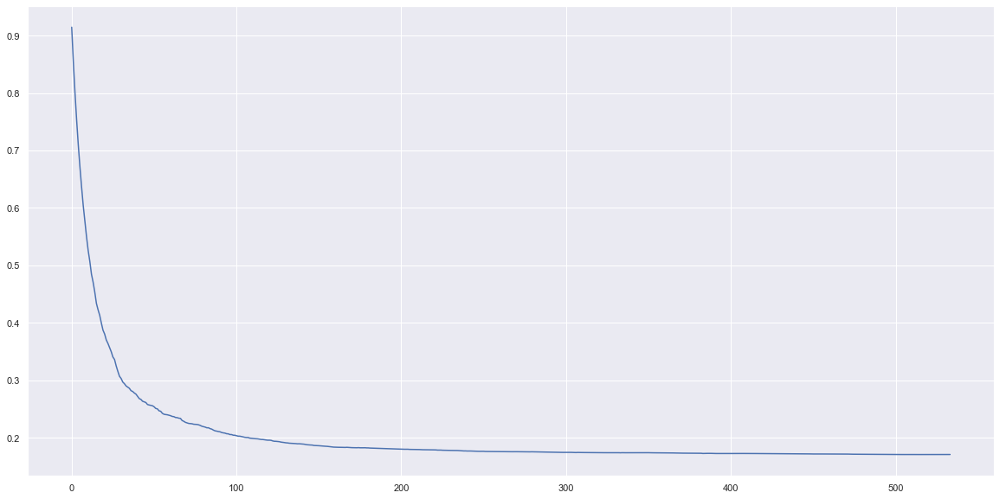

In [149]:
plt.plot(steps, err)

Text(0.5, 1.0, 'After Evaluate the model')

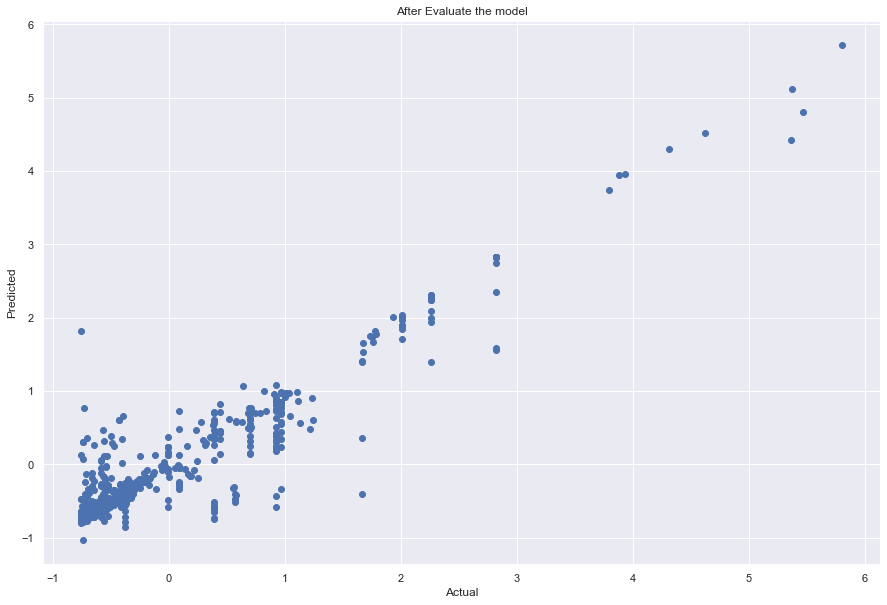

In [150]:
plt.figure(figsize=(15,10))
plt.scatter(y_test,xgb_predict)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('After Evaluate the model')

# save modal

In [151]:
import pickle
pickle.dump(xgb_model, open('model_f.pkl', 'wb'))

In [152]:
pickled_model = pickle.load(open('model_f.pkl', 'rb'))
pickled_model.predict(X_test)

array([ 0.3991331 , -0.73484343, -0.76696813, -0.32851267, -0.5782934 ,
       -0.27386102,  2.2547302 , -0.53427726,  0.3011554 , -0.6324244 ,
       -0.12190229, -0.5884377 ,  2.827143  , -0.5598324 ,  0.11481155,
       -0.6506244 , -0.45609137, -0.64009315,  0.46631262, -0.6447494 ,
        0.24028057,  0.74484223,  0.5547309 ,  0.3500631 ,  1.936718  ,
       -0.7449152 , -0.6799608 , -0.42779723, -0.574626  , -0.45776233,
        0.30123004,  2.3471887 ,  0.16365501, -0.7317893 , -0.32534036,
        2.2724538 , -0.746783  , -0.4842482 , -0.6707351 , -0.54019654,
        0.48048666, -0.5756356 , -0.74233896,  0.33472463, -0.7540243 ,
       -0.7255154 , -0.67835265, -0.39742008,  0.9554177 ,  4.5227427 ,
       -0.4391709 , -0.53520614, -0.55971557,  2.827143  , -0.5448289 ,
       -0.54164475, -0.45422804, -0.48528442, -0.43908876, -0.55193263,
        0.24637865, -0.56427485, -0.3803259 , -0.24485587, -0.51120013,
       -0.29294187,  2.827143  , -0.5725926 , -0.6222686 , -0.54

# thanks